[← Back to Index](../index)

# Quantization and sampling

Most signals in life are continuous: pressure waves propogating through air, chemical reactions, body movement. For computers to process these continuous signals, however, they must be converted to digital representations via a Analog-to-Digital Converter (ADC). A digital signal is different from its continous counterpart in two primary ways:
- It is **sampled** at specific **time steps**. For example, sound is often sampled at 44.1 kHz (or once every 0.023 milliseconds). 
- It is **quantized** at specific **voltage levels**. For example, on the Arduino Uno, the microcontroller has a 10-bit ADC, so an incoming, continuous voltage input can be discretized at $\frac{5V}{2^{10}}=4.88 mV$ steps.

In this lesson, we will use audio data is our primary signal. Sound is a wonderful medium for learning because we can both **visualize** and **hear** the signal. Recall that a microphone responds to air pressure waves. We'll plot these waveforms, manipulate them, and then play them. We suggest plugging in your headphones, so you can really hear the distinctions in the various audio samples.

**Note**: We downsample audio data to 3,000 Hz and below. We could not get Chrome to play audio at these lower sampling rates (but they did work in Firefox). We'll make a note of this again when it's relevant.

## Dependencies

This notebook requires [LibROSA](https://librosa.github.io/librosa/index.html)—a python package for music and audio analysis. To install this package, you have **two** options. 

First, from within Notebook, you can execute the following two lines within a cell (you'll only need to run this once):

```
import sys
!{sys.executable} -m pip install librosa
```

Second, from within your Anaconda shell:

```
> conda install -c conda-forge librosa
```

## Resources
- [Chapter 3: ADC and DAC](http://www.dspguide.com/ch3.htm), The Scientist and Engineer's Guide to Digital Signal Processing, Steven W. Smith, Ph.D.
- [Chapter 2: Signals in the Computer](http://faculty.washington.edu/stiber/pubs/Signal-Computing/Signal%20Computing.pdf), Signal Computing: Digital Signals in the Software Domain, Stiber, Stiber, and Larson, 2020
- [Notes on Music Information Retrieval](https://musicinformationretrieval.com/index.html)
- [D/A and A/D](https://youtu.be/cIQ9IXSUzuM), Monty Montgomery, YouTube

# Main imports

In [2]:
import librosa
import librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt # matplot lib is the premiere plotting lib for Python: https://matplotlib.org/
import numpy as np # numpy is the premiere signal handling library for Python: http://www.numpy.org/
import scipy as sp # for signal processing
from scipy import signal
import random
import makelab
from makelab import signal
from makelab import audio

# Quantization

Quantization refers to the process of transforming an analog signal, which has a continuous set of values, to a digital signal, which has a discrete set. See the figure below from Wikipedia's article on [Quantization](https://en.wikipedia.org/wiki/Quantization_(signal_processing)).

| 2-bit Quantization | 3-bit Quantization |
| :-----: | :-----: |
| ![2-bit resolution](https://upload.wikimedia.org/wikipedia/commons/b/b1/2-bit_resolution_analog_comparison.png) | ![3-bit resolution](https://upload.wikimedia.org/wikipedia/commons/b/b7/3-bit_resolution_analog_comparison.png) |
| 2-bit resolution quantizes the analog signal into four levels ($2^{2}$) | 3-bit resolution quantizes into eight levels ($2^{3}$) |

The ATmega328 on the Arduino Uno, for example, has a 10-bit analog-to-digital (ADC) converter while the ESP32 has a 12-bit analog-to-digital converter. Because the ATmega328 runs on 5V, the ADC "step size" is $\frac{5V}{2^{10}} = 4.88mV$. This is the tiniest discriminable change you can observe on the Uno's analog input pins. In contrast, the ESP32 runs on 3.3V and has a higher bit resolution (12 bits), so the ADC has much finer discretizations: $\frac{3.3V}{2^{12}} = 0.806mV$—roughly, six times more precision than the Uno!

## Characterizing quantization error

A digitized sample can have a maximum error of one-half the discretization step size (*i.e.,* ±½ the "Least Significant Bit" (LSB)). Why? Because when we convert an analog value to a digital one, we round to the nearest integer. Consider a voltage signal of 0.2271V on an Uno's analog input pin, this is nearly halfway between steps 0.2246V and 0.2295V, which would result in an error of $\frac{4.89mV}{2}$ (and either gets converted to 47 or 48 via `analogRead`).

## Example: how does quantization affect audio signals?
For the examples below, we'll work with pre-digitalized audio waveforms sampled at 44.1kHz and quantized at 16-bits. So, while not a true continuous sample (of course not, it's already a digital signal!), we'll loosely treat it as such. And we'll "downsample" to investigate the effects of quantization levels and sampling rates. 

Sampling rate: 44100 Hz
Number of channels = 1
Total samples: 30833
length = 0.6991609977324263s
[-15 -15 -20 ... 158 144 153]
16-bit audio ranges from -32768 to 32767
Max value: 24125 Avg value: -3.82


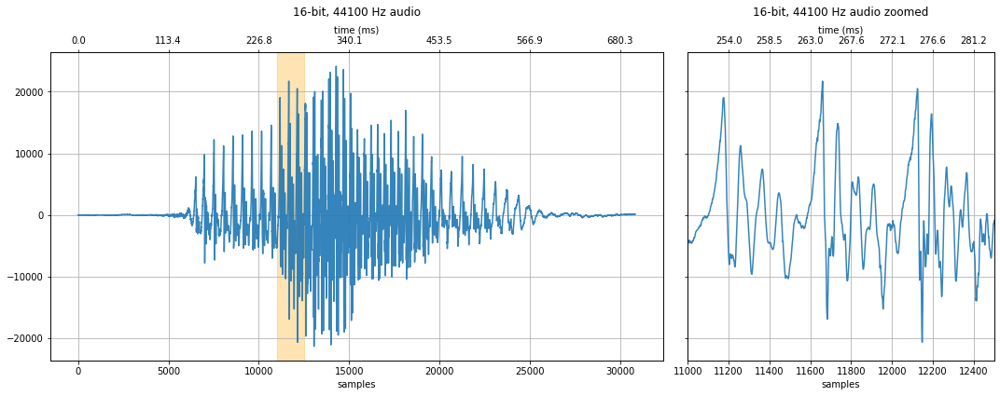

In [3]:
# Feel free to change this wave file to any 16-bit audio sample
sampling_rate, audio_data_16bit = sp.io.wavfile.read('data/audio/HumanVoice-Hello_16bit_44.1kHz_mono.wav')
# sampling_rate, audio_data_16bit = sp.io.wavfile.read('data/audio/greenday.wav')

print(f"Sampling rate: {sampling_rate} Hz")
print(f"Number of channels = {len(audio_data_16bit.shape)}")
print(f"Total samples: {audio_data_16bit.shape[0]}")

if len(audio_data_16bit.shape) == 2:
    # convert to mono
    audio_data_16bit = convert_to_mono(audio_data_16bit)
    

length_in_secs = audio_data_16bit.shape[0] / sampling_rate
print(f"length = {length_in_secs}s")
print(audio_data_16bit)
quantization_bits = 16
print(f"{quantization_bits}-bit audio ranges from -{2**(quantization_bits - 1)} to {2**(quantization_bits - 1) - 1}")
print(f"Max value: {np.max(audio_data_16bit)} Avg value: {np.mean(audio_data_16bit):.2f}")

# We'll highlight and zoom in on the orange part of the graph controlled by xlim_zoom
xlim_zoom = (11000, 12500) # you may want to change this depending on what audio file you have loaded
makelab.signal.plot_signal(audio_data_16bit, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
ipd.Audio(audio_data_16bit, rate=sampling_rate)


### 8-bit quantization

We can convert the 16-bit audio down to other quantization levels to see and hear how quantization affects quality.

[0 0 0 ... 0 0 0]
8-bit audio ranges from -128 to 127
Max value: 94 Avg value: 0.06


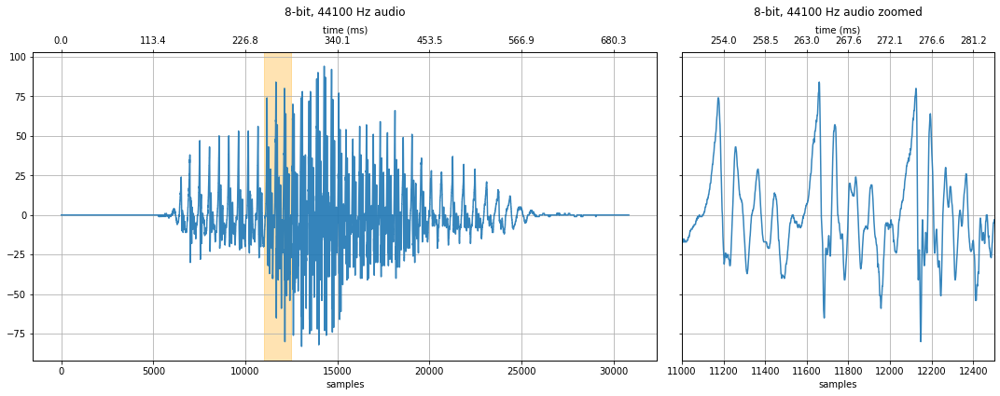

In [4]:
# Convert to float
audio_data_float = audio_data_16bit / 2**16 # 16 bit audio

# 8-bit audio. With 8-bit audio, the voice still sounds pretty good
quantization_bits = 8
audio_data_8bit = audio_data_float * 2**quantization_bits
audio_data_8bit = audio_data_8bit.astype(int)
print(audio_data_8bit)
print(f"{quantization_bits}-bit audio ranges from -{2**(quantization_bits - 1)} to {2**(quantization_bits - 1) - 1}")
print(f"Max value: {np.max(audio_data_8bit)} Avg value: {np.mean(audio_data_8bit):.2f}")

makelab.signal.plot_signal(audio_data_8bit, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
ipd.Audio(audio_data_8bit, rate=sampling_rate)

### 6-bit quantization
How about 6-bits? At this lavel, we can start to hear degradations in the signal—a hissing sound (at least with headphones).

[0 0 0 ... 0 0 0]
6-bit audio ranges from -32 to 31
Max value: 23 Avg value: 0.06


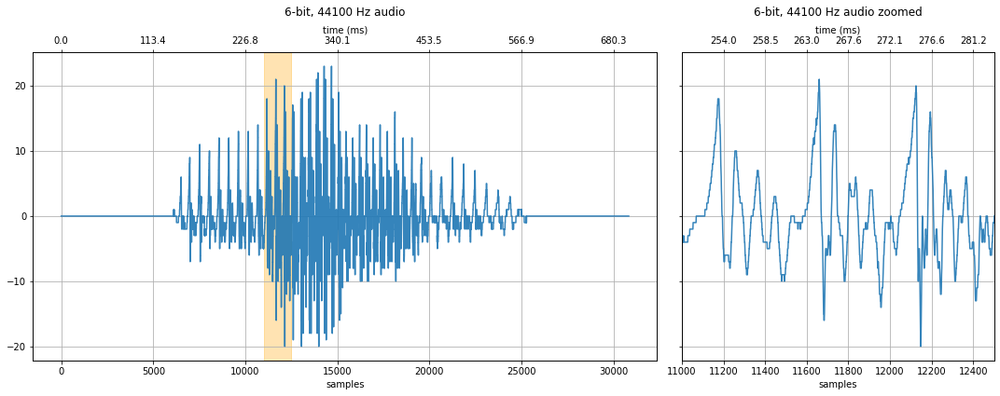

In [5]:
quantization_bits = 6
audio_data_6bit = audio_data_float * 2**quantization_bits
audio_data_6bit = audio_data_6bit.astype(int)
print(audio_data_6bit)
print(f"{quantization_bits}-bit audio ranges from -{2**(quantization_bits - 1)} to {2**(quantization_bits - 1) - 1}")
print(f"Max value: {np.max(audio_data_6bit)} Avg value: {np.mean(audio_data_6bit):.2f}")

makelab.signal.plot_signal(audio_data_6bit, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
ipd.Audio(audio_data_6bit, rate=sampling_rate)

### 4-bit quantization

At 4 bits, the noise is more substantial. Take a look at the zoom plot on the right, you can start to see the "steps" between quantization levels.

[0 0 0 ... 0 0 0]
4-bit audio ranges from -8 to 7
Max value: 5 Avg value: 0.05


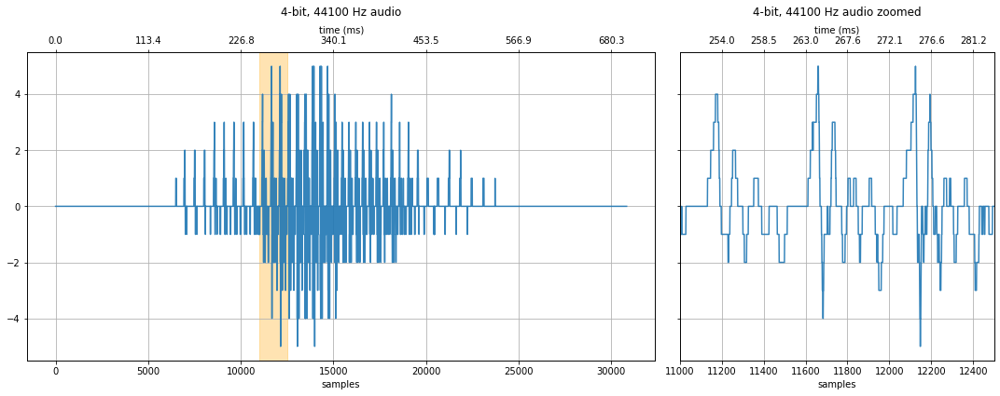

In [6]:
quantization_bits = 4
audio_data_4bit = audio_data_float * 2**quantization_bits
audio_data_4bit = audio_data_4bit.astype(int)
print(audio_data_4bit)
print(f"{quantization_bits}-bit audio ranges from -{2**(quantization_bits - 1)} to {2**(quantization_bits - 1) - 1}")
print(f"Max value: {np.max(audio_data_4bit)} Avg value: {np.mean(audio_data_4bit):.2f}")

makelab.signal.plot_signal(audio_data_4bit, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
ipd.Audio(audio_data_4bit, rate=sampling_rate)

### 3-bit quantization

At 3-bits, the sound is no longer intelligible—at least not if you *didn't* already know what the audio sample was saying. What parts of the degraded signal are still perceptible? There is still an observable "rhythm" to the sound.

[0 0 0 ... 0 0 0]
3-bit audio ranges from -4 to 3
Max value: 2 Avg value: 0.03


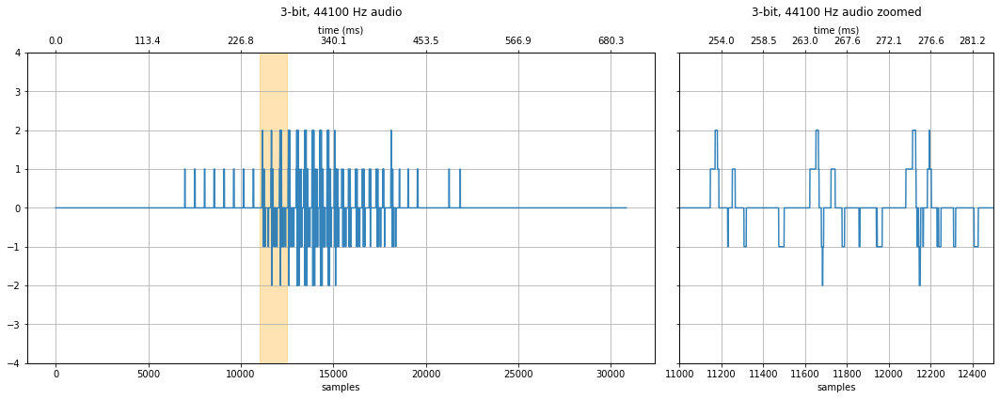

In [7]:
# 3-bit audio
quantization_bits = 3
audio_data_3bit = audio_data_float * 2**quantization_bits
audio_data_3bit = audio_data_3bit.astype(int)
print(audio_data_3bit)
print(f"{quantization_bits}-bit audio ranges from -{2**(quantization_bits - 1)} to {2**(quantization_bits - 1) - 1}")
print(f"Max value: {np.max(audio_data_3bit)} Avg value: {np.mean(audio_data_3bit):.2f}")

fig, axes = makelab.signal.plot_signal(audio_data_3bit, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
major_ticks = np.arange(-4, 5, 1)
axes[0].set_yticks(major_ticks)
axes[1].set_yticks(major_ticks)
ipd.Audio(audio_data_3bit, rate=sampling_rate)

### 2-bit quantization

What if we try 2-bit audio? That's only four quantization levels!

[0 0 0 ... 0 0 0]
2-bit audio ranges from -2 to 1
Max value: 1 Avg value: 0.00


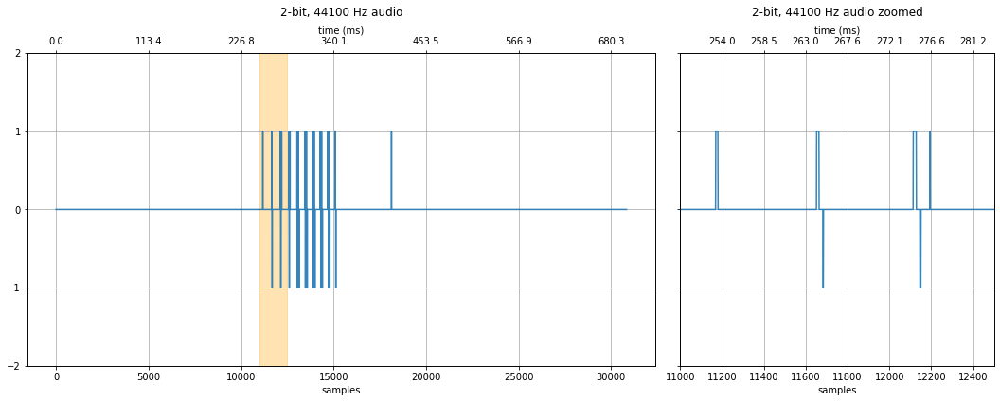

In [8]:
# 2-bit audio
quantization_bits = 2
audio_data_2bit = audio_data_float * 2**quantization_bits
audio_data_2bit = audio_data_2bit.astype(int)
print(audio_data_2bit)
print(f"{quantization_bits}-bit audio ranges from -{2**(quantization_bits - 1)} to {2**(quantization_bits - 1) - 1}")
print(f"Max value: {np.max(audio_data_2bit)} Avg value: {np.mean(audio_data_2bit):.2f}")

fig, axes = makelab.signal.plot_signal(audio_data_2bit, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
#axes[1].grid(ydata=[0, 1])
major_ticks = np.arange(-2, 3, 1)
axes[0].set_yticks(major_ticks)
axes[1].set_yticks(major_ticks)
ipd.Audio(audio_data_2bit, rate=sampling_rate)

## Exercise: play with your own audio data and quantization
As an exercise, try loading your own 16-bit audio sample—could be something that you record (like your voice or other sounds) or something you download (music). What do you observe?

Sampling rate: 44100 Hz
Number of channels = 2
Total samples: 1096151
Converting stereo audio file to mono
[0 0 0 ... 0 0 0]
6-bit audio ranges from -32 to 31
Max value: 26 Avg value: 0.01


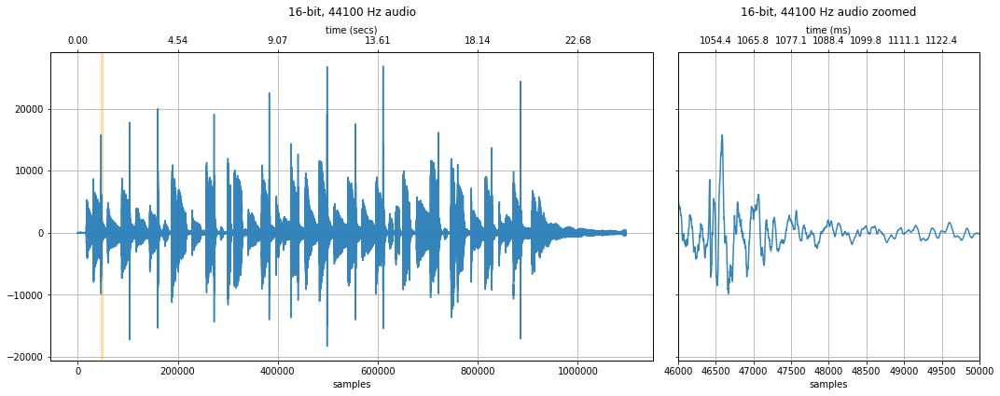

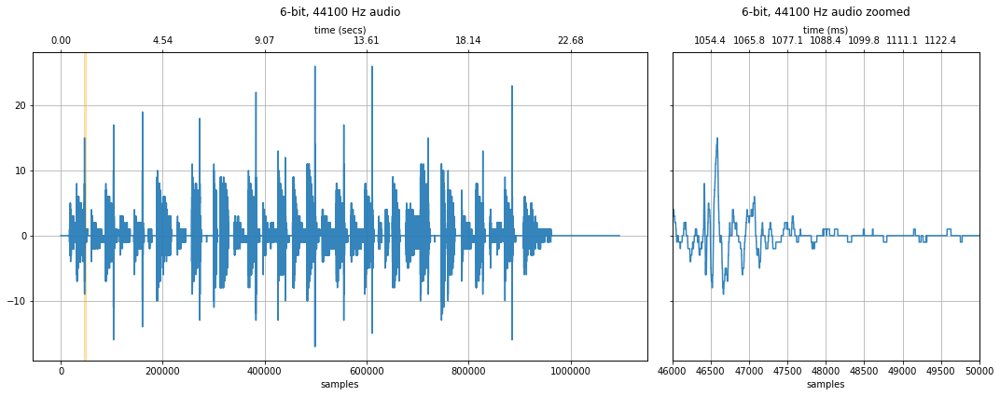

In [9]:
# Change this wave file to any 16-bit audio sample
your_sound_file = 'data/audio/Guitar_MoreThanWords_16bit_44.1kHz_stereo.wav'
your_sampling_rate, your_audio_data_16_bit = sp.io.wavfile.read(your_sound_file)

print(f"Sampling rate: {your_sampling_rate} Hz")
print(f"Number of channels = {len(your_audio_data_16_bit.shape)}")
print(f"Total samples: {your_audio_data_16_bit.shape[0]}")

if len(your_audio_data_16_bit.shape) == 2:
    # convert to mono
    print("Converting stereo audio file to mono")
    your_audio_data_16_bit = your_audio_data_16_bit.sum(axis=1) / 2

# Convert to float
your_audio_data_float = your_audio_data_16_bit / 2**16 # 16 bit audio

# Try different quantization levels here
quantization_bits = 6 # change this and see what happens!
your_audio_data_quantized = your_audio_data_float * 2**quantization_bits
your_audio_data_quantized = your_audio_data_quantized.astype(int)
print(your_audio_data_quantized)
print(f"{quantization_bits}-bit audio ranges from -{2**(quantization_bits - 1)} to {2**(quantization_bits - 1) - 1}")
print(f"Max value: {np.max(your_audio_data_quantized)} Avg value: {np.mean(your_audio_data_quantized):.2f}")

xlim_zoom = (46000, 50000) # make sure to change the zoom range too
makelab.signal.plot_signal(your_audio_data_16_bit, sampling_rate, 16, xlim_zoom = xlim_zoom)
makelab.signal.plot_signal(your_audio_data_quantized, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
ipd.Audio(your_audio_data_quantized, rate=sampling_rate)

# Sampling

<img src="https://upload.wikimedia.org/wikipedia/commons/5/50/Signal_Sampling.png" width="500">
<center>A continuous signal (in green) is sampled every $\frac{1}{T}$ Hz (in blue). From <a href="https://en.wikipedia.org/wiki/Sampling_(signal_processing)">Wikipedia</a></center>

In addition to quantization, the other key factor in digitizing a signal is the **rate** at which the analog signal is sampled (or captured). How often must you sample a signal to perfectly reconstruct it?

## Nyquist Sampling Theorem
The answer may surprise you and involves one of the most fundamental (and interesting) theorems in signal processing: the **Nyquist Sampling Theorem**, which states that a continuous signal can be reconstructed as long as there are **two samples** per period for the highest frequency component in the underlying signal.

That is, for a perfect reconstruction, our digital sampling frequency $f_s$ must be at least twice as fast as the **fastest** frequency in our continuous signal: $f_s = 2 * max(analog_{freq})$.

For example, imagine we have an analog signal composed of frequencies between 0 and 2,000 Hz. To properly digitize this signal, we must sample at $2 * 2,000Hz$. So, $f_s$ needs to be 4,000Hz.

Now imagine that the **fastest** our digitizer can sample is 6,000 Hz: what frequency range can we properly capture? Since we need a minimum of two samples per period for proper reconstruction, we can only signals that change with a frequency of 0 to a maximum of 3,000Hz. This 3,000Hz limit is called the **Nyquist rate** or **Nyquist limit**: it is $\frac{1}{2}$ the sampling rate $f_s$.

For many applications related to Human-Computer Interaction and Ubiquitous Computing, sampling at 4kHz is more than sufficient. This enables analysis of any signal between 0-2kHz. Human motion—ambulatory movement, limb motion, finger gestures, etc.—simply does not change that fast. Even electroencephalograms (EEG), which measure electrical activity in the brain, are often sampled at 500-1000Hz. However, for recording sound (humans can hear between ~0-20kHz), faster sampling rates are necessary.


## Aliasing

What happens if we sample a signal with frequency components greater than the Nyquist limit ($> \frac{1}{2} * f_s$)? We get **[aliasing](https://en.wikipedia.org/wiki/Aliasing#Sampling_sinusoidal_functions)**—a problem where the higher frequency components of a signal (those greater than the Nyquist limit) appear as lower frequency components. As [Smith](http://www.dspguide.com/CH3.PDF) notes, "just as a criminal might take on an asumed named or identity (an *alias*), the sinusoid assumes another frequency that is not its own." And perhaps more nefariously, there is nothing in the sampled data to suggest that aliasing has occured: "the sine wave has hidden its true identity completely". See figure below.

<img src="assets/images/NyquistSamplingTheoremAndAliasing_1500w.png"/>

### Aliasing example

Let's look at an example. Here, we'll sample four signals at a sampling rate of 50Hz: `signal1 = 5Hz`, `signal2 = 10Hz`, `signal3 = 20Hz`, and `signal4 = 60Hz`. All but `signal4` are under our Nyquist limit, which is $\frac{1}{2} * 50Hz = 25Hz$. What will happen?

The "samples" are shown as vertical lines with square rectangle markers. What do you observe? Pay close attention to `signal4`...

Sampling rate: 50.0 Hz


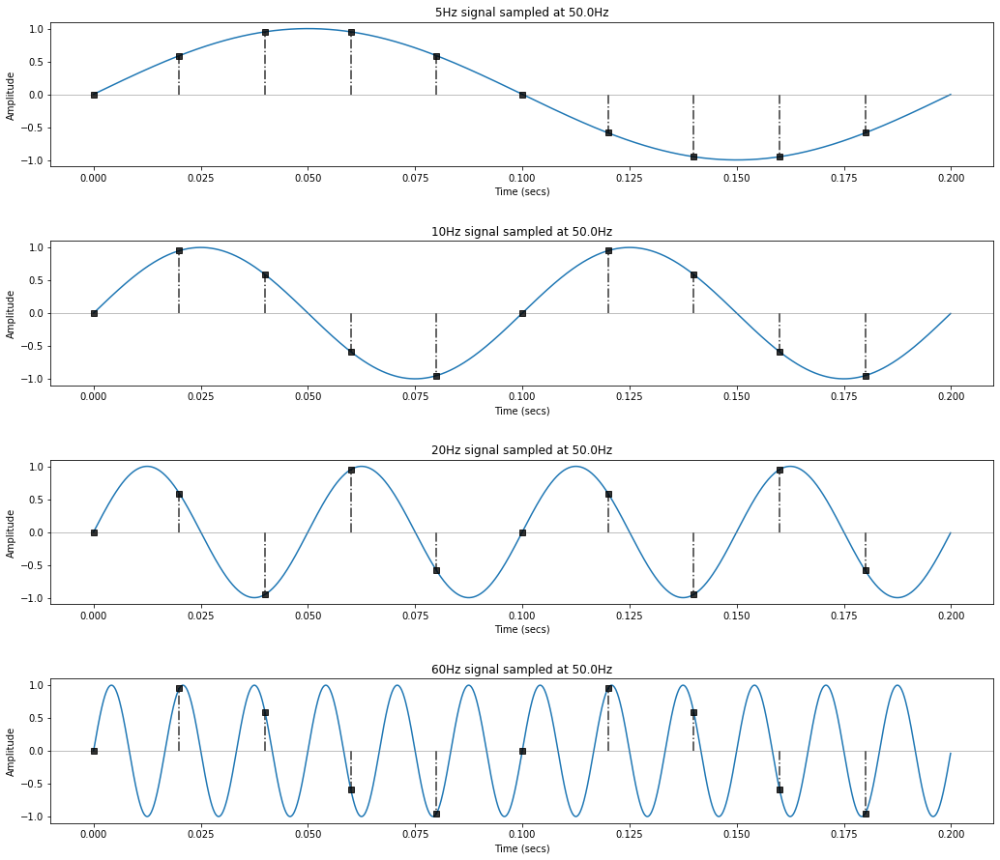

In [10]:
total_time_in_secs = 0.2

# Create our "real-world" continuous signals (which is obviously not possible on a digital computer, so we fake it)
real_world_continuous_speed = 10000
real_world_signal1_freq = 5
time, real_world_signal1 = makelab.signal.create_sine_wave(real_world_signal1_freq, real_world_continuous_speed, 
                                               total_time_in_secs, return_time = True)

real_world_signal2_freq = 10
real_world_signal2 = makelab.signal.create_sine_wave(real_world_signal2_freq, real_world_continuous_speed, 
                                               total_time_in_secs)

real_world_signal3_freq = 20
real_world_signal3 = makelab.signal.create_sine_wave(real_world_signal3_freq, real_world_continuous_speed, 
                                               total_time_in_secs)

real_world_signal4_freq = 60
real_world_signal4 = makelab.signal.create_sine_wave(real_world_signal4_freq, real_world_continuous_speed, 
                                               total_time_in_secs)

# Create the sampled versions of these continuous signals
resample_factor = 200 # should be an integer
sampled_time = time[::resample_factor]
sampled_signal1 = real_world_signal1[::resample_factor]
sampled_signal2 = real_world_signal2[::resample_factor]
sampled_signal3 = real_world_signal3[::resample_factor]
sampled_signal4 = real_world_signal4[::resample_factor]
sampling_rate = real_world_continuous_speed / resample_factor
print(f"Sampling rate: {sampling_rate} Hz")

# Visualize the sampled versions
fig, axes = plt.subplots(4, 1, figsize=(15,13))
axes[0].plot(time, real_world_signal1)
axes[0].axhline(0, color="gray", linestyle="-", linewidth=0.5)
axes[0].plot(sampled_time, sampled_signal1, linestyle='None', alpha=0.8, marker='s', color='black')
axes[0].vlines(sampled_time, ymin=0, ymax=sampled_signal1, linestyle='-.', alpha=0.8, color='black')
axes[0].set_ylabel("Amplitude")
axes[0].set_xlabel("Time (secs)")
axes[0].set_title(f"{real_world_signal1_freq}Hz signal sampled at {sampling_rate}Hz")

axes[1].plot(time, real_world_signal2)
axes[1].axhline(0, color="gray", linestyle="-", linewidth=0.5)
axes[1].plot(sampled_time, sampled_signal2, linestyle='None', alpha=0.8, marker='s', color='black')
axes[1].vlines(sampled_time, ymin=0, ymax=sampled_signal2, linestyle='-.', alpha=0.8, color='black')
axes[1].set_ylabel("Amplitude")
axes[1].set_xlabel("Time (secs)")
axes[1].set_title(f"{real_world_signal2_freq}Hz signal sampled at {sampling_rate}Hz")

axes[2].plot(time, real_world_signal3)
axes[2].axhline(0, color="gray", linestyle="-", linewidth=0.5)
axes[2].plot(sampled_time, sampled_signal3, linestyle='None', alpha=0.8, marker='s', color='black')
axes[2].vlines(sampled_time, ymin=0, ymax=sampled_signal3, linestyle='-.', alpha=0.8, color='black')
axes[2].set_ylabel("Amplitude")
axes[2].set_xlabel("Time (secs)")
axes[2].set_title(f"{real_world_signal3_freq}Hz signal sampled at {sampling_rate}Hz")

axes[3].plot(time, real_world_signal4)
axes[3].axhline(0, color="gray", linestyle="-", linewidth=0.5)
axes[3].plot(sampled_time, sampled_signal4, linestyle='None', alpha=0.8, marker='s', color='black')
axes[3].vlines(sampled_time, ymin=0, ymax=sampled_signal4, linestyle='-.', alpha=0.8, color='black')
axes[3].set_ylabel("Amplitude")
axes[3].set_xlabel("Time (secs)")
axes[3].set_title(f"{real_world_signal4_freq}Hz signal sampled at {sampling_rate}Hz")

fig.tight_layout(pad = 3.0)

Let's take a closer look at `signal2 = 10Hz` and `signal4 = 60Hz`. To make it easier to see the sampled signal, we'll lighten the underlying continuous (real-world) signal in blue.

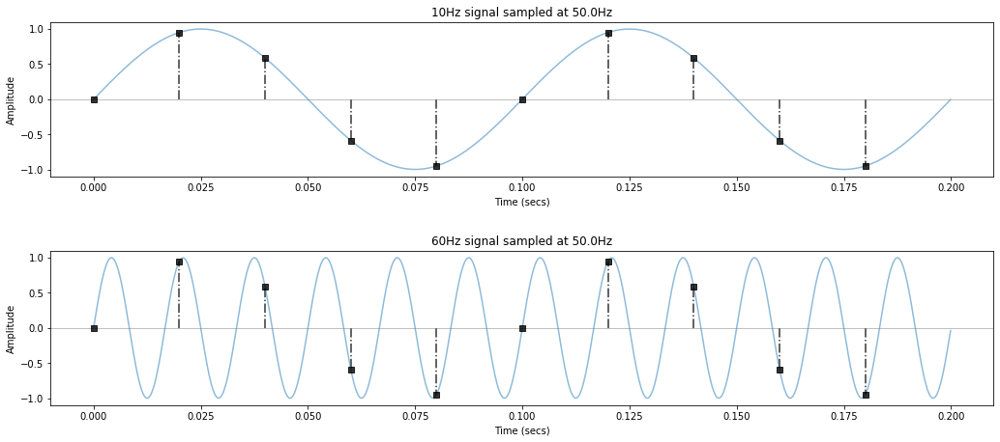

In [11]:
fig, axes = plt.subplots(2, 1, figsize=(15,7))

axes[0].plot(time, real_world_signal2, alpha=0.5)
axes[0].axhline(0, color="gray", linestyle="-", linewidth=0.5)
axes[0].plot(sampled_time, sampled_signal2, linestyle='None', alpha=0.8, marker='s', color='black')
axes[0].vlines(sampled_time, ymin=0, ymax=sampled_signal2, linestyle='-.', alpha=0.8, color='black')
axes[0].set_ylabel("Amplitude")
axes[0].set_xlabel("Time (secs)")
axes[0].set_title(f"{real_world_signal2_freq}Hz signal sampled at {sampling_rate}Hz")

axes[1].plot(time, real_world_signal4, alpha=0.5)
axes[1].axhline(0, color="gray", linestyle="-", linewidth=0.5)
axes[1].plot(sampled_time, sampled_signal4, linestyle='None', alpha=0.8, marker='s', color='black')
axes[1].vlines(sampled_time, ymin=0, ymax=sampled_signal4, linestyle='-.', alpha=0.8, color='black')
axes[1].set_ylabel("Amplitude")
axes[1].set_xlabel("Time (secs)")
axes[1].set_title(f"{real_world_signal4_freq}Hz signal sampled at {sampling_rate}Hz")

fig.tight_layout(pad = 3.0)

Can you see it? The 60Hz signal is being **aliased** as 10Hz. And once the signal is digitized (as it is here), there would be no way to tell the difference between an actual 10Hz signal and an aliased one!

Why?

Look at the graphs, at the first sample, both sinusoids are just beginning; however, by the next sample, the 60Hz sinusoid has almost completed one full period!

### Aliasing frequency formula

The formula to derive the aliased frequency is $|n * f_s - f|$ where $f_s$ is our sampling frequency, $f$ is the real-world signal frequency, and $n$ is the closest integer multiple of the sampling frequency (that is, $round(\frac{f}{f_s}) * f_s$). Thus, aliasing follows a triangle wave.

Perhaps it is easier to explain in code. :)

In [12]:
fs = sampling_rate
real_world_signal_freq = 110 # change this
nearest_integer_multiple = round(real_world_signal_freq / fs)
aliased_freq = abs(nearest_integer_multiple * fs - real_world_signal_freq)

print(f"Real-world signal freq: {real_world_signal_freq}")
print(f"Sampling rate: {fs}")
print(f"Nearest integer multiple: {nearest_integer_multiple}")
print(f"Aliased freq: {aliased_freq}")

Real-world signal freq: 110
Sampling rate: 50.0
Nearest integer multiple: 2
Aliased freq: 10.0


If you graph this equation with a linear frequency sweep, you get a triangle wave:

Text(0, 0.5, 'Frequencies (sampled)')

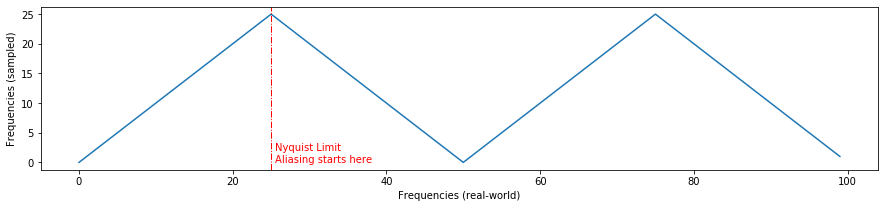

In [24]:
real_world_freqs = np.arange(0, 100, 1)
sampled_freqs = [abs(round(rwf / fs) * fs - rwf) for rwf in real_world_freqs]

fig, axes = plt.subplots(1, 1, figsize=(15,3))
axes.plot(real_world_freqs, sampled_freqs)

nyquist_limit = fs / 2
axes.axvline(nyquist_limit, color='r', linestyle="-.", linewidth=1)
axes.text(nyquist_limit + 0.5, 0, "Nyquist Limit\nAliasing starts here", color='r')
axes.set_xlabel("Frequencies (real-world)")
axes.set_ylabel("Frequencies (sampled)")

Let's look at a few more sampling rates (but still sampling a signal that linearly increases in frequency from 0Hz to 100Hz)

Text(50.5, 93, 'Nyquist limit for 100Hz sampling\nAliasing starts here')

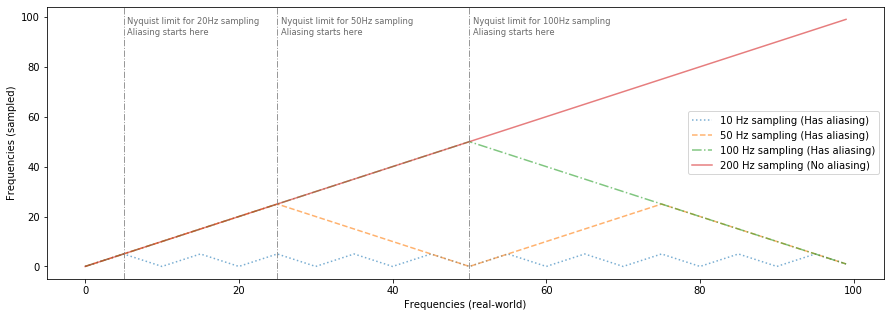

In [47]:
real_world_freqs = np.arange(0, 100, 1)

sampling_rate_10hz = 10
sampled_freqs_at_10hz = [abs(round(rwf / sampling_rate_10hz) * sampling_rate_10hz - rwf) for rwf in real_world_freqs]

sampling_rate_50hz = 50
sampled_freqs_at_50hz = [abs(round(rwf / sampling_rate_50hz) * sampling_rate_50hz - rwf) for rwf in real_world_freqs]

sampling_rate_100hz = 100
sampled_freqs_at_100hz = [abs(round(rwf / sampling_rate_100hz) * sampling_rate_100hz - rwf) for rwf in real_world_freqs]

sampling_rate_200hz = 200
sampled_freqs_at_200hz = [abs(round(rwf / sampling_rate_200hz) * sampling_rate_200hz - rwf) for rwf in real_world_freqs]

fig, axes = plt.subplots(1, 1, figsize=(15,5))
axes.plot(real_world_freqs, sampled_freqs_at_10hz, alpha = 0.6, linestyle=":", label="10 Hz sampling (Has aliasing)")
axes.plot(real_world_freqs, sampled_freqs_at_50hz, alpha = 0.6, linestyle="--", label="50 Hz sampling (Has aliasing)")
axes.plot(real_world_freqs, sampled_freqs_at_100hz, alpha = 0.6, linestyle="-.", label="100 Hz sampling (Has aliasing)")
axes.plot(real_world_freqs, sampled_freqs_at_200hz, alpha = 0.6, linestyle="-", label="200 Hz sampling (No aliasing)")

axes.set_xlabel("Frequencies (real-world)")
axes.set_ylabel("Frequencies (sampled)")
axes.legend()

# nyquist_limit = fs / 2
axes.axvline(sampling_rate_10hz / 2, color='gray', linestyle="-.", linewidth=1, alpha=0.8)
axes.text(sampling_rate_10hz / 2 + 0.5, 93, "Nyquist limit for 20Hz sampling\nAliasing starts here", color='dimgray', fontsize='smaller')

axes.axvline(sampling_rate_50hz / 2, color='gray', linestyle="-.", linewidth=1, alpha=0.8)
axes.text(sampling_rate_50hz / 2 + 0.5, 93, "Nyquist limit for 50Hz sampling\nAliasing starts here", color='dimgray', fontsize='smaller')

axes.axvline(sampling_rate_100hz / 2, color='gray', linestyle="-.", linewidth=1, alpha=0.8)
axes.text(sampling_rate_100hz / 2 + 0.5, 93, "Nyquist limit for 100Hz sampling\nAliasing starts here", color='dimgray', fontsize='smaller')


Given the aliasing formula, with a 50Hz sampling rate, 40Hz, 60Hz, 90Hz, 110Hz, 140Hz... will all be aliased to 10Hz. However, note that 40Hz and 60Hz (and 90Hz and 110Hz, and so on) will be aliased to 10Hz but with a phase shift of one-half period. 

Similarly, 70Hz, 80Hz, 120Hz, and 130Hz will all be alised to 20Hz and 50Hz, 100Hz, 150Hz, etc. will all be aliased to zero.  

Let's check it out:

Sampling rate: 50.0 Hz


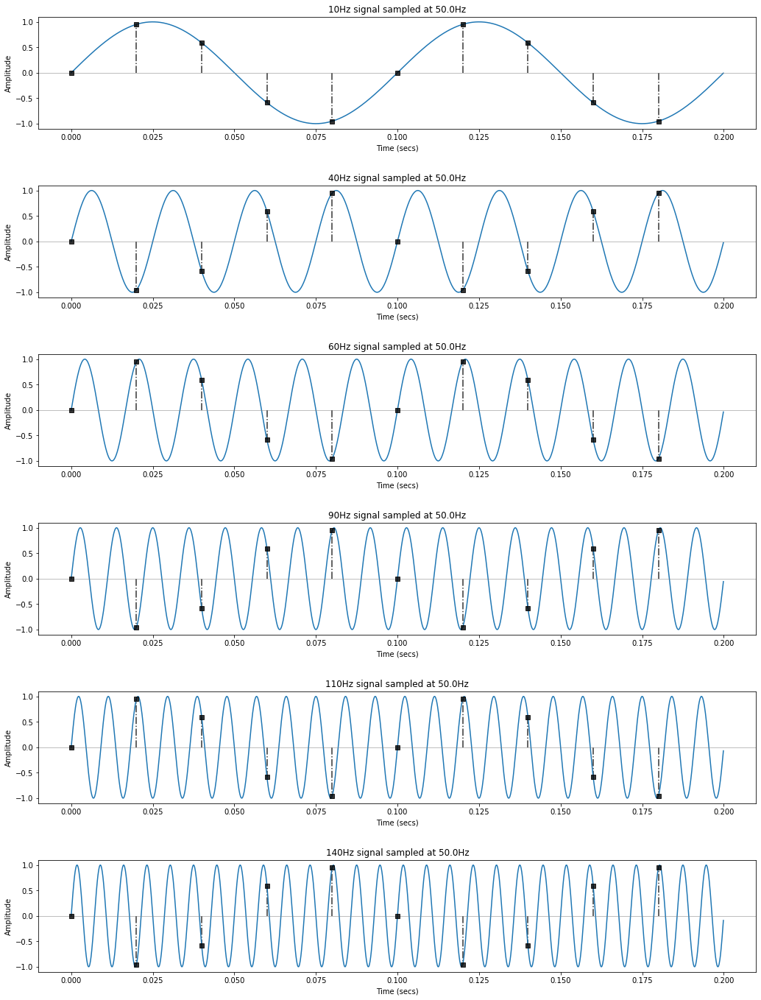

In [6]:
# feel free to change these values to see other patterns
real_world_freqs = [10, 40, 60, 90, 110, 140]
makelab.signal.plot_sampling_demonstration(total_time_in_secs, real_world_freqs)

Sampling rate: 50.0 Hz


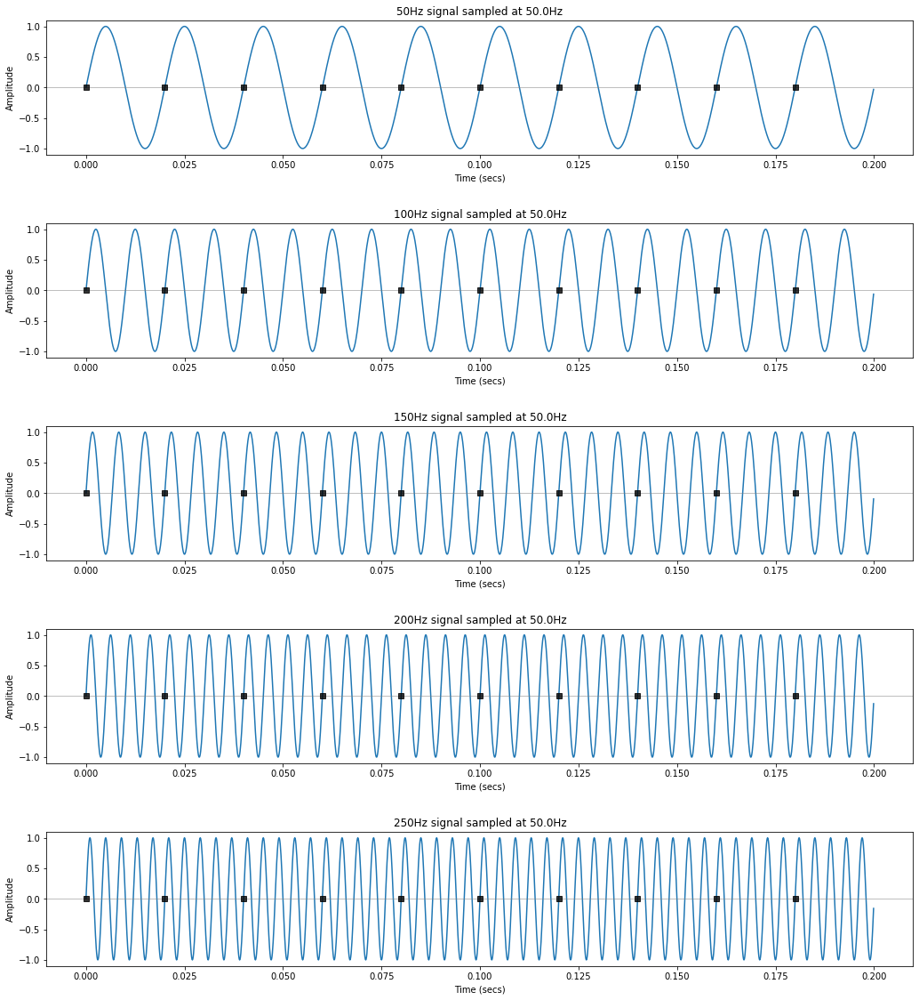

In [48]:
# aliasing to zero
real_world_freqs = [50, 100, 150, 200, 250]
makelab.signal.plot_sampling_demonstration(total_time_in_secs, real_world_freqs)

## Experimenting with the Nyquist limit

Let's keep experimenting with the Nyquist limit and aliasing but this time with sound data. Sound is a bit harder to visualize than our synthetic signals above because it's very high frequency (comparatively) but we'll provide zoomed insets to help.

We will also be using spectrogram visualizations to help us investigate the effect of lower sampling rates on the signal. A spectrogram plots the frequency components of our signal over time.

### Frequency sweep from 0 - 22,050Hz

Let's start with a frequency sweep from 0 to 22,050Hz over the course of 30 sec period.

#### Sweep with sampling rate of 44,100 Hz

16-bit audio
Sampling rate: 44100 Hz
Number of channels = 1
Total samples: 1323000


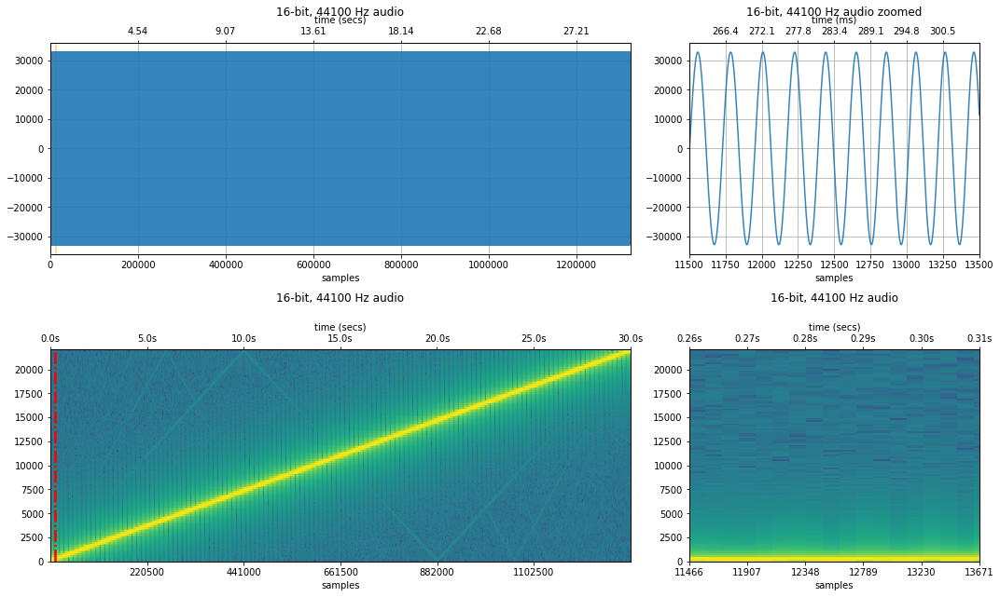

In [13]:
sampling_rate, freq_sweep_44100 = sp.io.wavfile.read('data/audio/FrequencySweep_0-22050Hz_30secs.wav')
#sampling_rate, audio_data_44100 = sp.io.wavfile.read('data/audio/greenday.wav')

quantization_bits = 16
print(f"{quantization_bits}-bit audio") # we assume 16 bit audio
print(f"Sampling rate: {sampling_rate} Hz")
print(f"Number of channels = {len(freq_sweep_44100.shape)}")
print(f"Total samples: {freq_sweep_44100.shape[0]}")

if len(freq_sweep_44100.shape) == 2:
    # convert to mono
    print("Converting stereo audio file to mono")
    freq_sweep_44100 = freq_sweep_44100.sum(axis=1) / 2

# Set a zoom area (a bit hard to see but highlighted in red in spectrogram)
xlim_zoom = (11500, 13500)
makelab.signal.plot_signal_and_spectrogram(freq_sweep_44100, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
ipd.Audio(freq_sweep_44100, rate=sampling_rate)

#### Same sweep but with a 11,025 Hz sampling rate
Now, imagine that we captured this frequency sweep with a $f_s$ of 11,025Hz. What will the sweep sound like now? What's the maximum frequency that we can capture with $f_s = 11,025Hz$?

Well, from the **Nyquist limit**, we know that with $f_s$, the maximum capturable frequency is $\frac{1}{2} * f_s$. Thus, the maximum frequency that we can capture is $\frac{1}{2} * 11,025 Hz = 5512.5 Hz$. Recall, however, that the underlying audio signal contains frequencies from 0 to 22,050Hz. So, what will happen with frequencies between 5,512.5 - 22,050Hz in our signal?

Yes, **aliasing** strikes again. Those higher frequency signals will be aliased to lower frequencies.

Let's see the problem in action below.

Sampling rate: 44100 Hz with Nyquist limit 22050 Hz
New sampling rate: 11025 Hz with Nyquist limit 5512 Hz


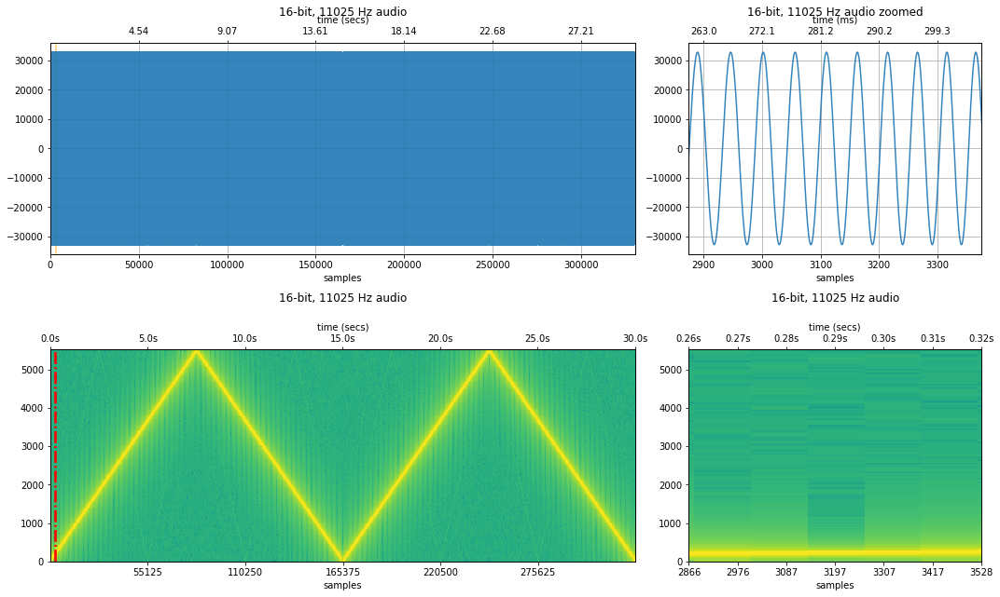

In [14]:
resample_factor = 4
new_sampling_rate = int(sampling_rate / resample_factor)
freq_sweep_11025 = freq_sweep_44100[::resample_factor]
resample_xlim_zoom = (xlim_zoom[0] / resample_factor, xlim_zoom[1] / resample_factor)
# plot_waveform(audio_data_11025, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
print(f"Sampling rate: {sampling_rate} Hz with Nyquist limit {int(sampling_rate / 2)} Hz")
print(f"New sampling rate: {new_sampling_rate} Hz with Nyquist limit {int(new_sampling_rate / 2)} Hz")

makelab.signal.plot_signal_and_spectrogram(freq_sweep_11025, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
ipd.Audio(freq_sweep_11025, rate=new_sampling_rate)

With a sampling rate of 11,025Hz, we see aliasing occur when the frequency sweep hits 5,512.5 Hz.

#### Same sweep but with a 882 Hz sampling rate
Let's try again but this time with a 882Hz sampling rate (yes, this is a significant reduction but let's check it out!).

Note: I could not get any sound samples with sampling rates less than 3,000Hz to play in Chrome on Windows. However, I was able to play signals with sampling rates as low as 100Hz on Firefox (v75). I am *not* referring to the sound frequency but the sampling frequency of the signal. Here's a related [discussion online](https://github.com/jupyter/notebook/issues/4321#issuecomment-536264680). So, if you want to play these low-sampling rate samples, try with Firefox.


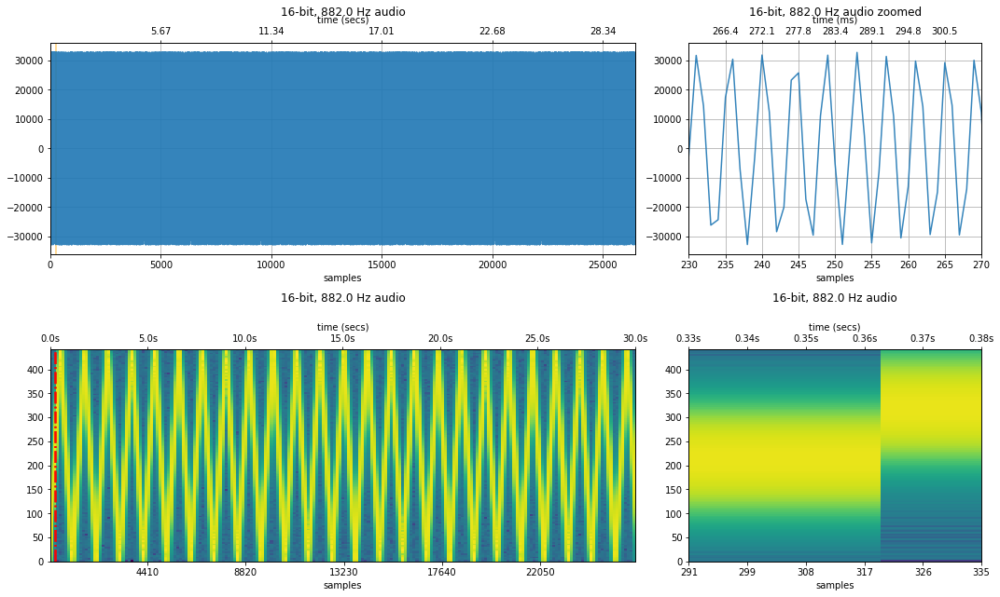

In [15]:
resample_factor = 50
new_sampling_rate = sampling_rate / resample_factor
freq_sweep_882 = freq_sweep_44100[::resample_factor]
resample_xlim_zoom = (xlim_zoom[0] / resample_factor, xlim_zoom[1] / resample_factor)

makelab.signal.plot_signal_and_spectrogram(freq_sweep_882, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
ipd.Audio(freq_sweep_882, rate=new_sampling_rate)

### Playing a chord with frequencies from 261Hz to 4186Hz

Let's play a chord composed of the following frequencies: 261.626Hz, 293.665Hz, 391.995Hz, 2093Hz, and 4186.01Hz.

Given that the highest frequency in this signal is 4,186.01Hz, we need a minimum sampling rate of $2 * 4186.01Hz = 8372.02Hz$ to capture the highest frequency and $2 * 2093Hz = 4,186Hz$ to capture the next highest frequency.

#### Sampled at 44,100Hz

The original sampling was at 44,100Hz, which is more than sufficient to capture the sound signal.

Sampling rate: 44100 Hz
Number of channels = 1
Total samples: 88200


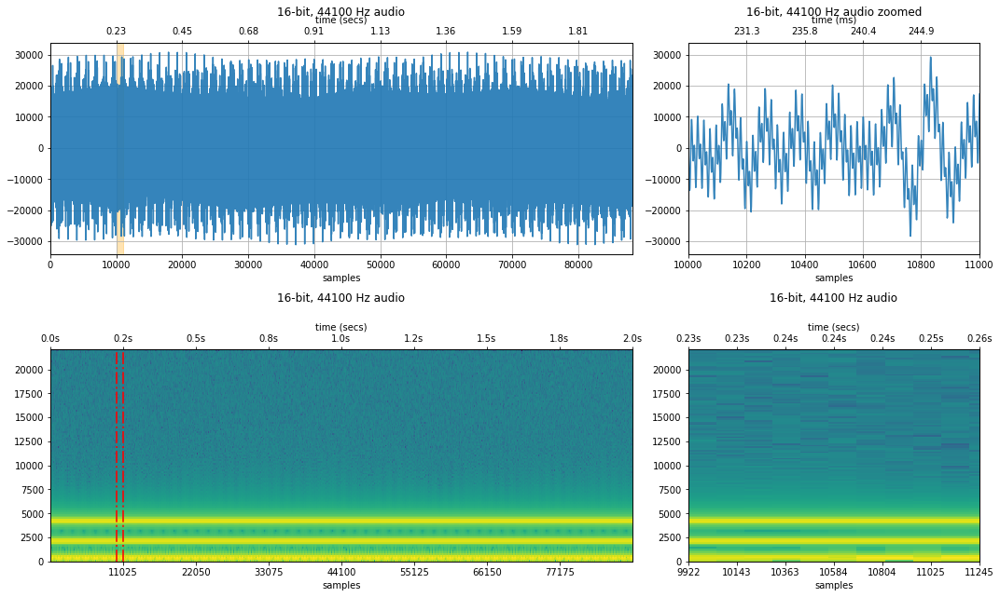

In [16]:
# Equation used to produce the audio file
# 0.2 * sin(2*pi*261.626*t) + 0.2 *  sin(2*pi*293.665*t) + 0.2 * sin(2*pi*391.995*t) + 0.2 *  sin(2*pi*2093*t) + 0.2 * sin(2*pi*4186.01*t) 

sinewavechord_soundfile = 'data/audio/SineWaveChord_MinFreq261_MaxFreq4186_2secs.wav'
sampling_rate, sine_wave_chord_44100 = sp.io.wavfile.read(sinewavechord_soundfile)
#sampling_rate, audio_data_44100 = sp.io.wavfile.read('data/audio/greenday.wav')

print(f"Sampling rate: {sampling_rate} Hz")
print(f"Number of channels = {len(sine_wave_chord_44100.shape)}")
print(f"Total samples: {sine_wave_chord_44100.shape[0]}")

if len(sine_wave_chord_44100.shape) == 2:
    # convert to mono
    print("Converting stereo audio file to mono")
    sine_wave_chord_44100 = sine_wave_chord_44100.sum(axis=1) / 2
    
quantization_bits = 16
xlim_zoom = (10000, 11000)
makelab.signal.plot_signal_and_spectrogram(sine_wave_chord_44100, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
ipd.Audio(sine_wave_chord_44100, rate=sampling_rate)

#### Sampled at 11,025 Hz

At a sampling rate of 11,025Hz, the Nyquist limit (5,512Hz) is still above the maximum frequency in our signal (4186.01 Hz), so the audio should sound the exact same as it did for the original 44,100 Hz sample above (and no aliasing will occur).

Sampling rate: 44100 Hz with Nyquist limit 22050 Hz
New sampling rate: 11025 Hz with Nyquist limit 5512 Hz


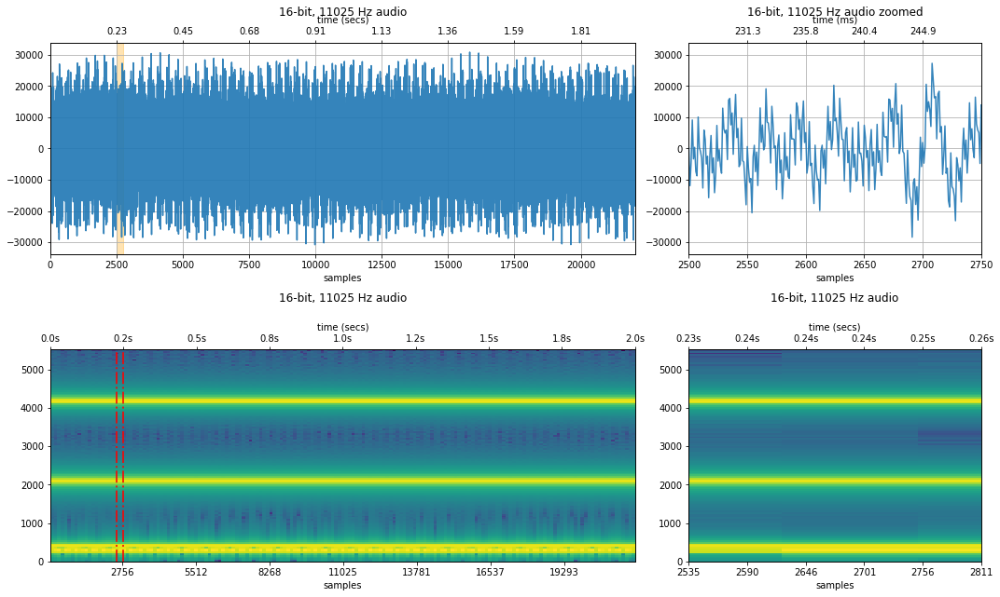

In [17]:
resample_factor = 4
new_sampling_rate = int(sampling_rate / resample_factor)
sine_wave_chord_11025 = sine_wave_chord_44100[::resample_factor]
resample_xlim_zoom = (xlim_zoom[0] / resample_factor, xlim_zoom[1] / resample_factor)
# plot_waveform(audio_data_11025, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
print(f"Sampling rate: {sampling_rate} Hz with Nyquist limit {int(sampling_rate / 2)} Hz")
print(f"New sampling rate: {new_sampling_rate} Hz with Nyquist limit {int(new_sampling_rate / 2)} Hz")

makelab.signal.plot_signal_and_spectrogram(sine_wave_chord_11025, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
ipd.Audio(sine_wave_chord_11025, rate=new_sampling_rate)

#### Sampled at 4,410Hz

What about if the sampling rate $f_s$ is 4,410Hz? Then the Nyquist limit is 2,205Hz, which is below the 4186.01 Hz signal.

Recall our aliased frequency formula: so what will 4186.01Hz show up as in our sampled signal? It will be aliased as 223.99Hz.

Let's check to see what happens.

Sampling rate: 44100 Hz with Nyquist limit 22050 Hz
New sampling rate: 4410 Hz with Nyquist limit 2205 Hz


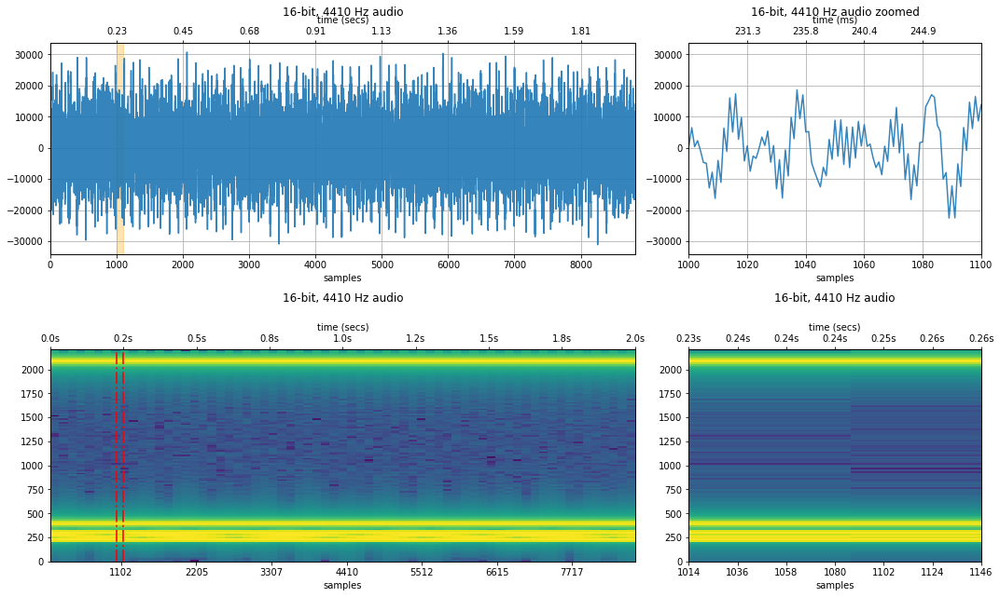

In [18]:
resample_factor = 10
new_sampling_rate = int(sampling_rate / resample_factor)
sine_wave_chord_4410 = sine_wave_chord_44100[::resample_factor]
resample_xlim_zoom = (xlim_zoom[0] / resample_factor, xlim_zoom[1] / resample_factor)

print(f"Sampling rate: {sampling_rate} Hz with Nyquist limit {int(sampling_rate / 2)} Hz")
print(f"New sampling rate: {new_sampling_rate} Hz with Nyquist limit {int(new_sampling_rate / 2)} Hz")

makelab.signal.plot_signal_and_spectrogram(sine_wave_chord_4410, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
ipd.Audio(sine_wave_chord_4410, rate=new_sampling_rate)

It's a bit hard to tell whether 4186.01Hz was aliased as 223.99Hz. Let's use a different style of frequency visualization called a frequency spectrum plot—this visualization is particularly useful here given that our sinewave chord does not change over time.

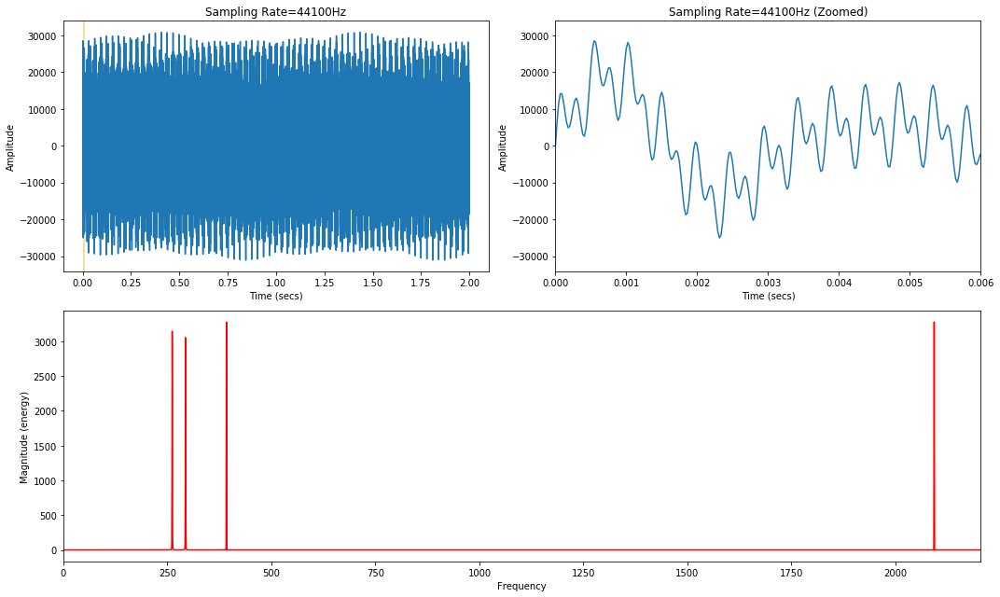

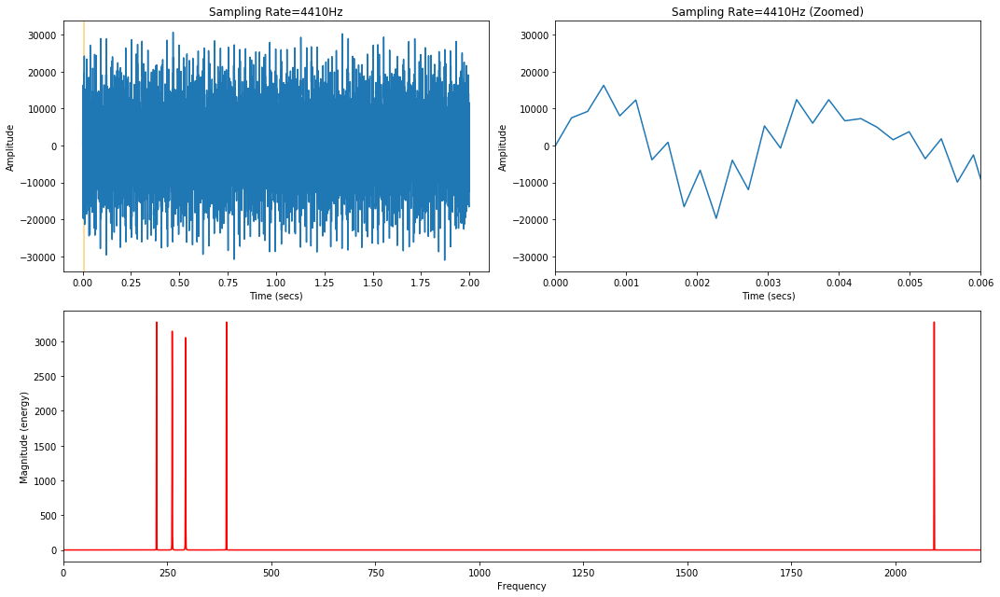

In [19]:
zoom_show_num_periods = 3
xlim_zoom_in_secs = (0, zoom_show_num_periods * 1 / 500)

graph_title = f"Sampling Rate={sampling_rate}Hz"
s = sine_wave_chord_44100
t = np.linspace(0, len(s) / sampling_rate, num=len(s))
fig, axes = makelab.signal.plot_signal_and_magnitude_spectrum(t, s, sampling_rate, graph_title, xlim_zoom_in_secs = xlim_zoom_in_secs)
axes[2].set_xlim(0, new_sampling_rate / 2)

graph_title = f"Sampling Rate={new_sampling_rate}Hz"
s = sine_wave_chord_4410
t = np.linspace(0, len(s) / new_sampling_rate, num=len(s))
fig, axes = makelab.signal.plot_signal_and_magnitude_spectrum(t, s, new_sampling_rate, graph_title, xlim_zoom_in_secs = xlim_zoom_in_secs)
axes[2].set_xlim(0, new_sampling_rate / 2)

ipd.Audio(s, rate=new_sampling_rate)

Notice how the bottom frequency spectrum plot—the one corresponding to the 4,410Hz sampling rate—has an additional frequency right where we predicted: at around 223.99Hz! This is 4186.01Hz aliased as 223.99Hz.

#### Experiment with your own sampling rates
Try experimenting with your own sampling rates below. Remember, on Chrome, we can only play signals with sampling rates > 3,000Hz

Sampling rate: 44100 Hz with Nyquist limit 22050 Hz
New sampling rate: 4410 Hz with Nyquist limit 2205 Hz


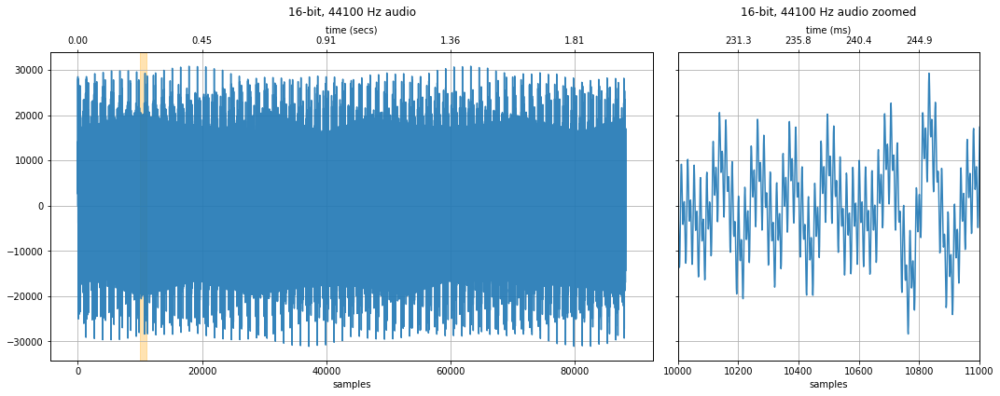

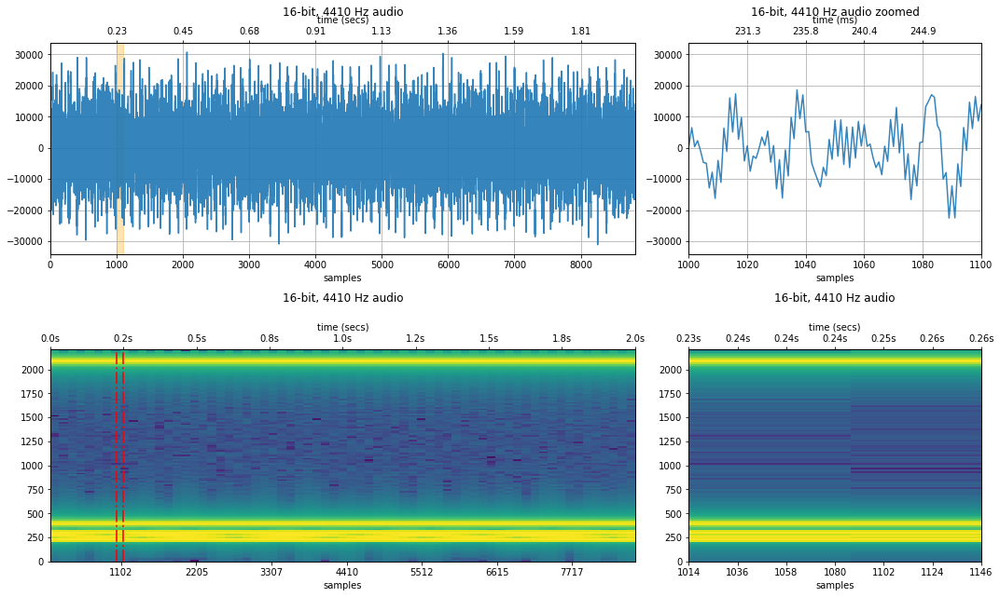

In [20]:
resample_factor = 10 # change this value, what happens?
new_sampling_rate = int(sampling_rate / resample_factor)
sine_wave_chord_resampled = sine_wave_chord_44100[::resample_factor]
resample_xlim_zoom = (xlim_zoom[0] / resample_factor, xlim_zoom[1] / resample_factor)
# plot_waveform(audio_data_11025, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
print(f"Sampling rate: {sampling_rate} Hz with Nyquist limit {int(sampling_rate / 2)} Hz")
print(f"New sampling rate: {new_sampling_rate} Hz with Nyquist limit {int(new_sampling_rate / 2)} Hz")

makelab.signal.plot_signal(sine_wave_chord_44100, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
makelab.signal.plot_signal_and_spectrogram(sine_wave_chord_resampled, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
ipd.Audio(sine_wave_chord_resampled, rate=new_sampling_rate)

## Example: how do sampling rates affect sound quality?

Below, we downsample a 44.1 kHz human voice to: 22.5kHz, 11,025Hz ... 441 Hz. For each downsampling, we visualize the original 44.1 kHz waveform as well as its downsampled counterpart. 

We also show a spectrogram—which visualizes the frequency component of the signal across time. What changes do you observe? How is the voice distorted at lower sampling rates?

Sampling rate: 44100 Hz
Number of channels = 1
Total samples: 30833


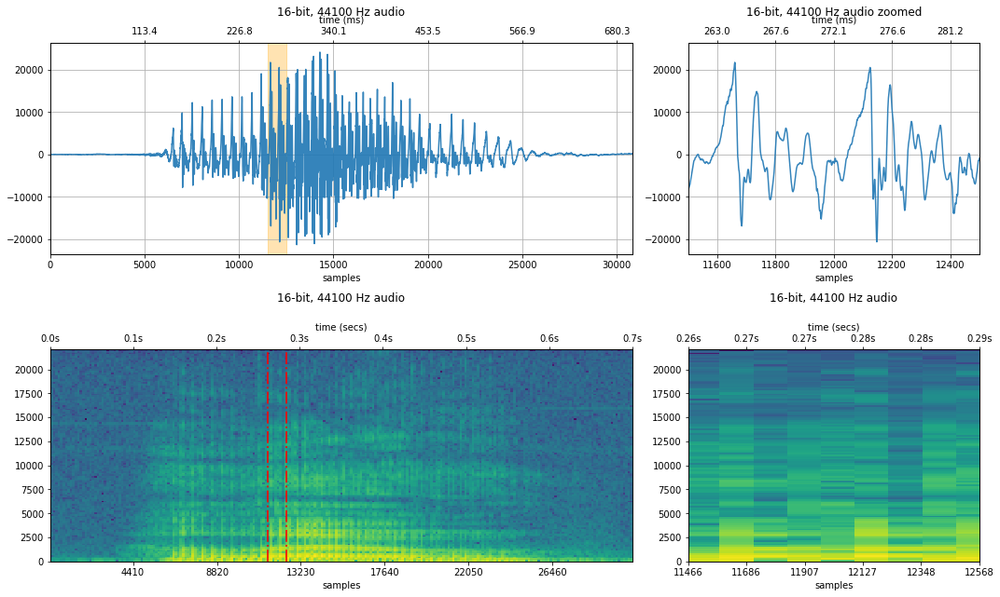

In [21]:
# feel free to change this to some other 44.1kHz sound file
sound_file = 'data/audio/HumanVoice-Hello_16bit_44.1kHz_mono.wav' 
sampling_rate, audio_data_44100 = sp.io.wavfile.read(sound_file)

print(f"Sampling rate: {sampling_rate} Hz")
print(f"Number of channels = {len(audio_data_44100.shape)}")
print(f"Total samples: {audio_data_44100.shape[0]}")

if len(audio_data_44100.shape) == 2:
    # convert to mono
    print("Converting stereo audio file to mono")
    audio_data_44100 = audio_data_44100.sum(axis=1) / 2
    
quantization_bits = 16
xlim_zoom = (11500, 12500)

makelab.signal.plot_signal_and_spectrogram(audio_data_44100, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
ipd.Audio(audio_data_44100, rate=sampling_rate)


### 22500 Hz sampling rate

New sampling rate: 22050 Hz
resample_xlim_zoom (5750.0, 6250.0)


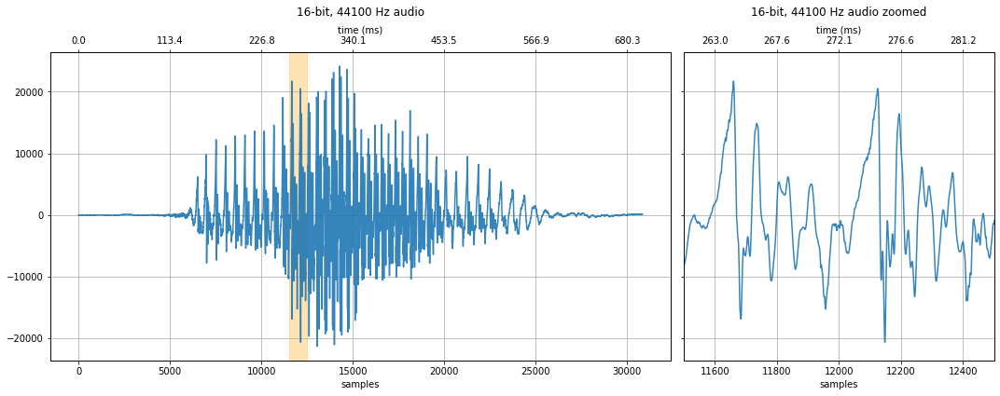

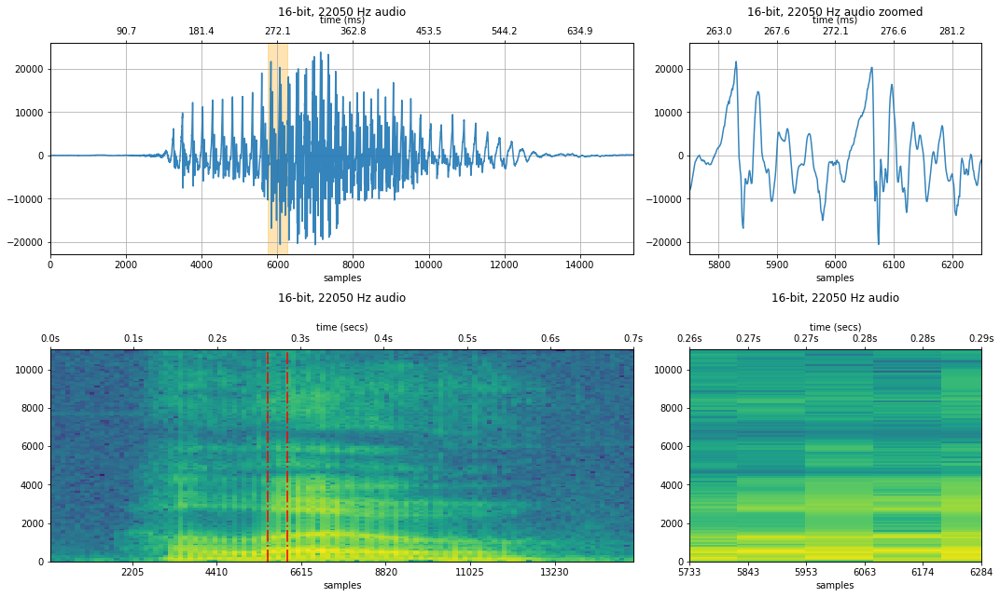

In [22]:
resample_factor = 2
new_sampling_rate = int(sampling_rate / resample_factor)
audio_data_22500 = audio_data_44100[::resample_factor]
print(f"New sampling rate: {new_sampling_rate} Hz")
resample_xlim_zoom = (xlim_zoom[0] / resample_factor, xlim_zoom[1] / resample_factor)
print("resample_xlim_zoom", resample_xlim_zoom)
#plot_audio(audio_data_22500, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
ipd.Audio(audio_data_22500, rate=new_sampling_rate)

# plot_spectrogram(audio_data_22500, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
makelab.signal.plot_signal(audio_data_44100, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
makelab.signal.plot_signal_and_spectrogram(audio_data_22500, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
ipd.Audio(audio_data_22500, rate=new_sampling_rate)

### 11,025 Hz sampling rate

Sampling rate: 44100 Hz with Nyquist limit 22050 Hz
New sampling rate: 11025 Hz with Nyquist limit 5512 Hz


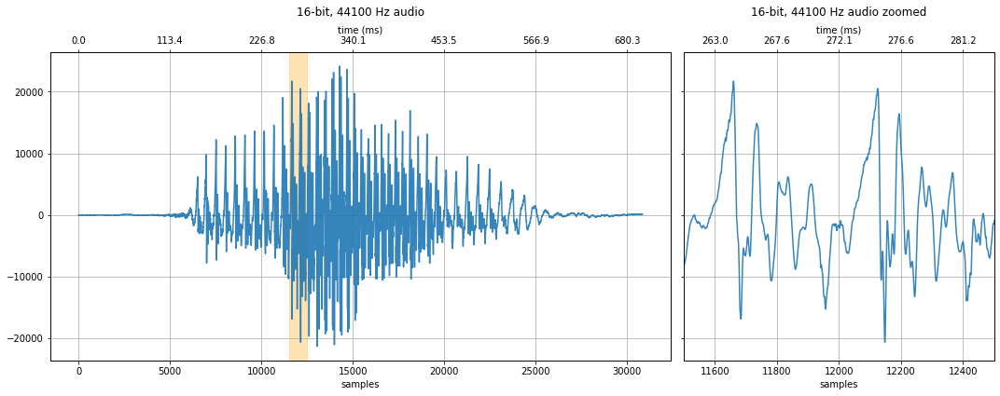

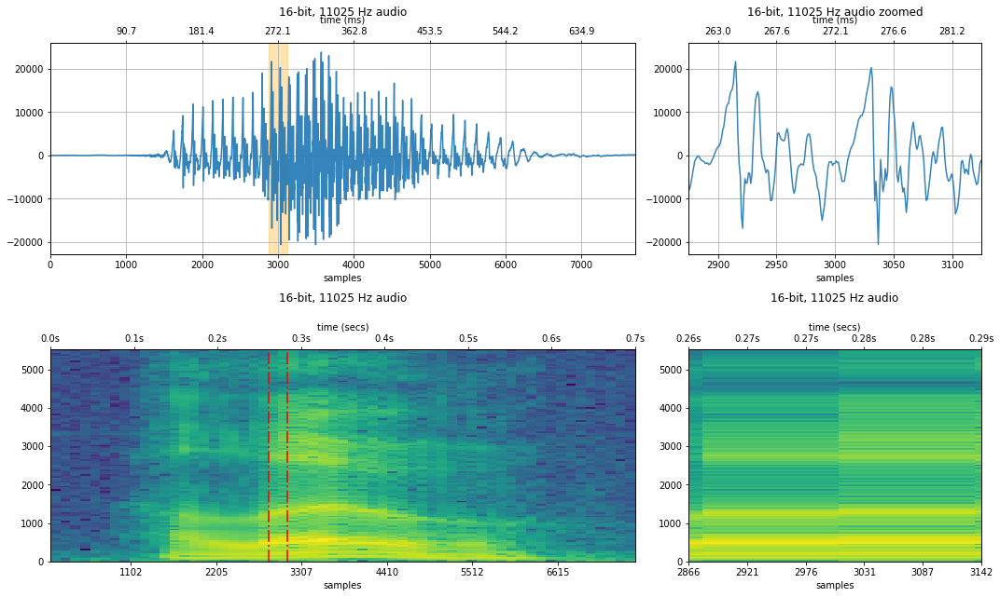

In [23]:
resample_factor = 4
new_sampling_rate = int(sampling_rate / resample_factor)
audio_data_11025 = audio_data_44100[::resample_factor]
resample_xlim_zoom = (xlim_zoom[0] / resample_factor, xlim_zoom[1] / resample_factor)
# plot_waveform(audio_data_11025, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
print(f"Sampling rate: {sampling_rate} Hz with Nyquist limit {int(sampling_rate / 2)} Hz")
print(f"New sampling rate: {new_sampling_rate} Hz with Nyquist limit {int(new_sampling_rate / 2)} Hz")

makelab.signal.plot_signal(audio_data_44100, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
makelab.signal.plot_signal_and_spectrogram(audio_data_11025, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
ipd.Audio(audio_data_11025, rate=new_sampling_rate)



### 4,410 Hz sampling rate

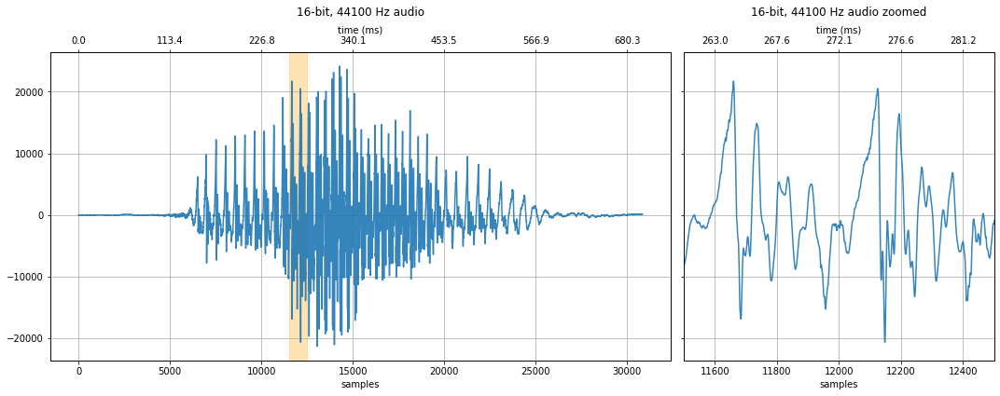

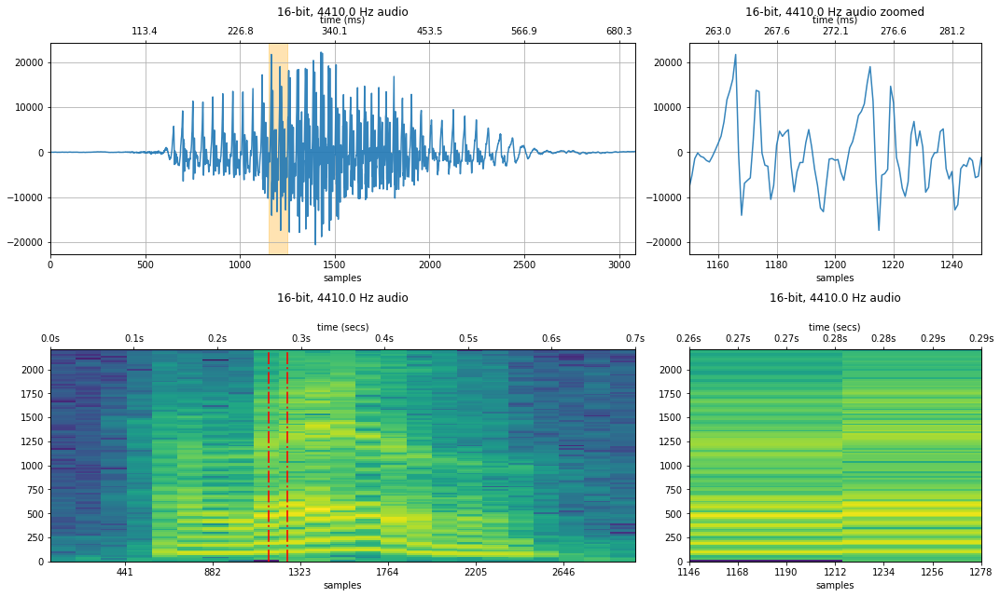

In [24]:
resample_factor = 10
new_sampling_rate = sampling_rate / resample_factor
audio_data_4410 = audio_data_44100[::resample_factor]
resample_xlim_zoom = (xlim_zoom[0] / resample_factor, xlim_zoom[1] / resample_factor)
makelab.signal.plot_signal(audio_data_44100, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
#plot_waveform(audio_data_4410, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
makelab.signal.plot_signal_and_spectrogram(audio_data_4410, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
ipd.Audio(audio_data_4410, rate=new_sampling_rate)

### 2,205 Hz sampling rate
At sampling rates less than 3,000 Hz, the audio signal would no longer play in Chrome (but it did work in Firefox)

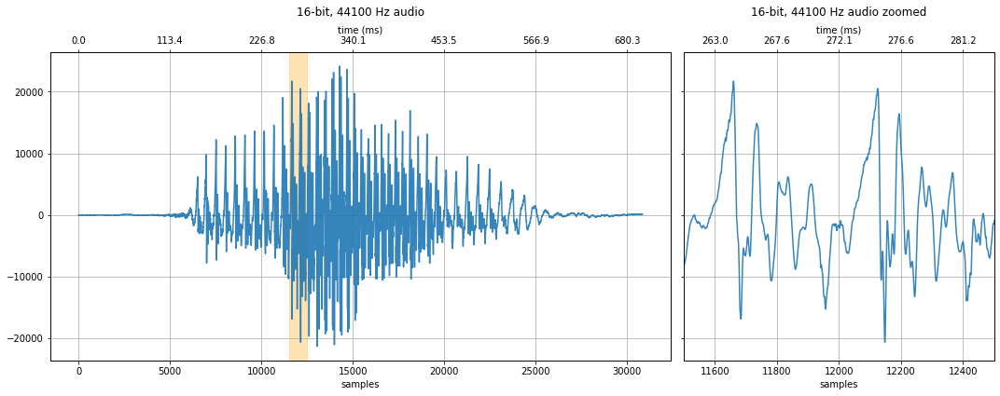

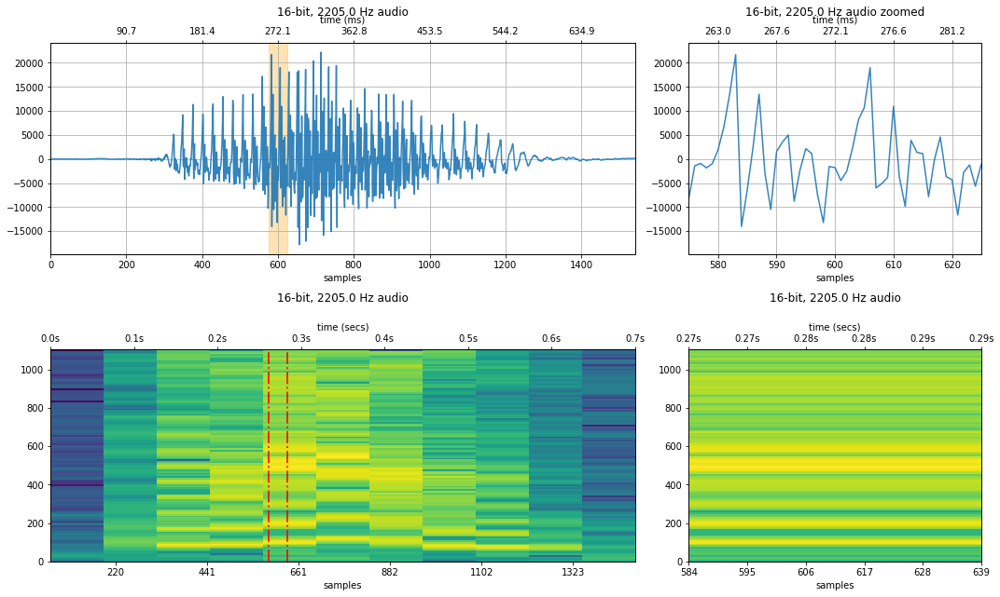

In [25]:
resample_factor = 20
new_sampling_rate = sampling_rate / resample_factor
audio_data_2205 = audio_data_44100[::resample_factor]
resample_xlim_zoom = (xlim_zoom[0] / resample_factor, xlim_zoom[1] / resample_factor)

makelab.signal.plot_signal(audio_data_44100, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
#plot_waveform(audio_data_4410, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
makelab.signal.plot_signal_and_spectrogram(audio_data_2205, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
ipd.Audio(audio_data_2205, rate=new_sampling_rate)

### 1,407 Hz sampling rate

Again, I could not get audio to play with a sampling rate < 3,000 Hz on Chrome.

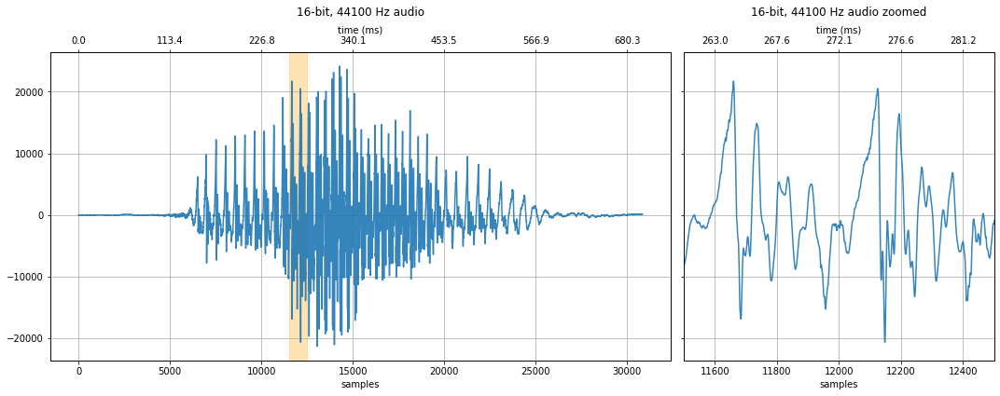

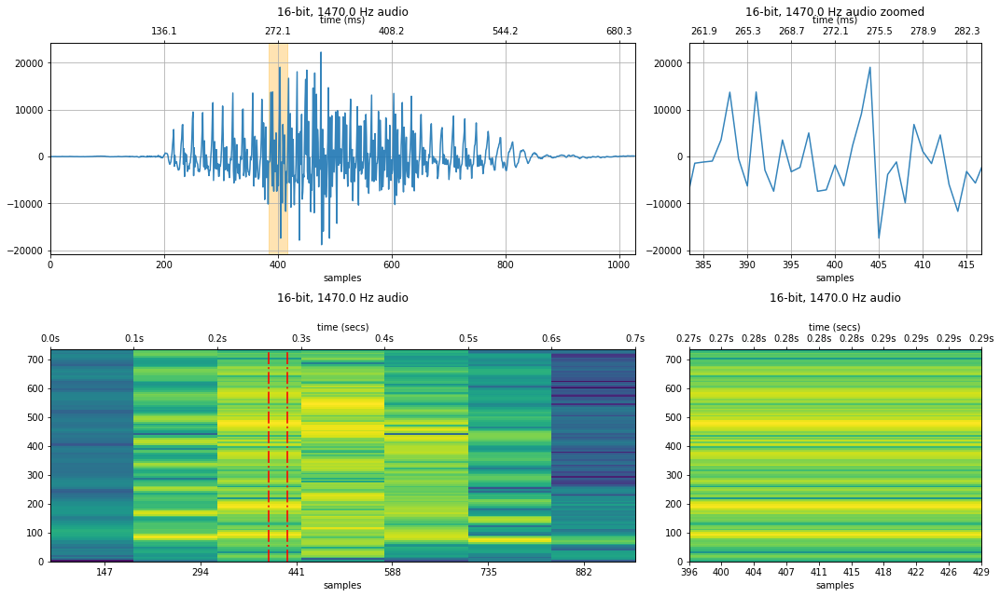

In [26]:
resample_factor = 30
new_sampling_rate = sampling_rate / resample_factor
audio_data_1407 = audio_data_44100[::resample_factor]
resample_xlim_zoom = (xlim_zoom[0] / resample_factor, xlim_zoom[1] / resample_factor)
makelab.signal.plot_signal(audio_data_44100, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
#plot_waveform(audio_data_1407, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
makelab.signal.plot_signal_and_spectrogram(audio_data_1407, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
ipd.Audio(audio_data_1407, rate=new_sampling_rate)

### 882 Hz sampling rate

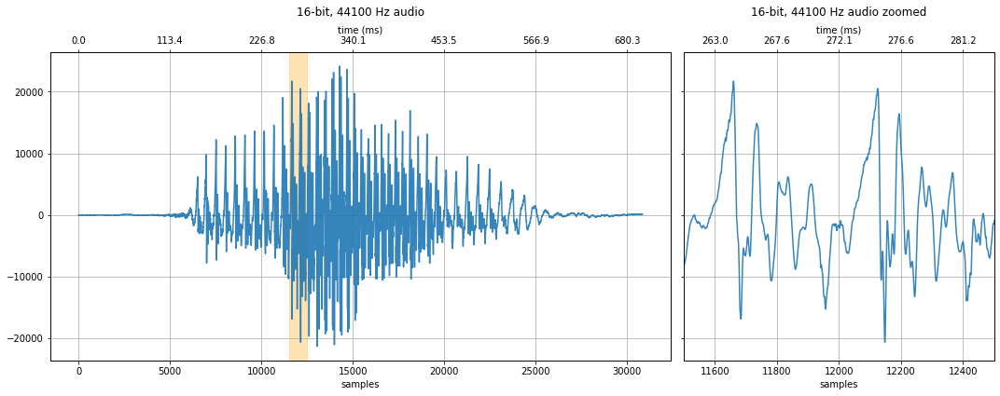

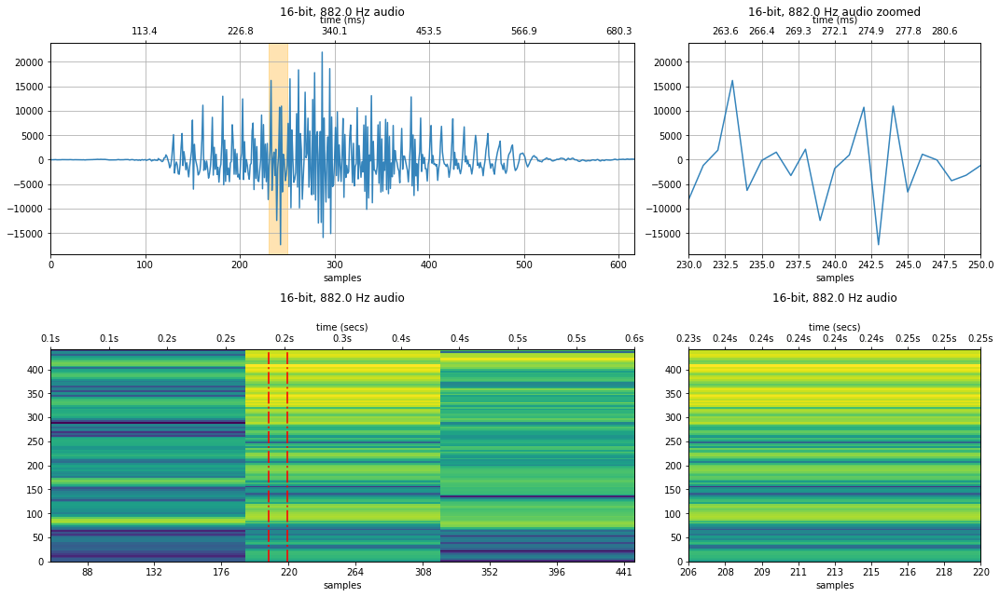

In [27]:
resample_factor = 50
new_sampling_rate = sampling_rate / resample_factor
audio_data_882 = audio_data_44100[::resample_factor]
resample_xlim_zoom = (xlim_zoom[0] / resample_factor, xlim_zoom[1] / resample_factor)

makelab.signal.plot_signal(audio_data_44100, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
#plot_waveform(audio_data_882, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
makelab.signal.plot_signal_and_spectrogram(audio_data_882, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
ipd.Audio(audio_data_882, rate=new_sampling_rate)

### 441 Hz sampling rate

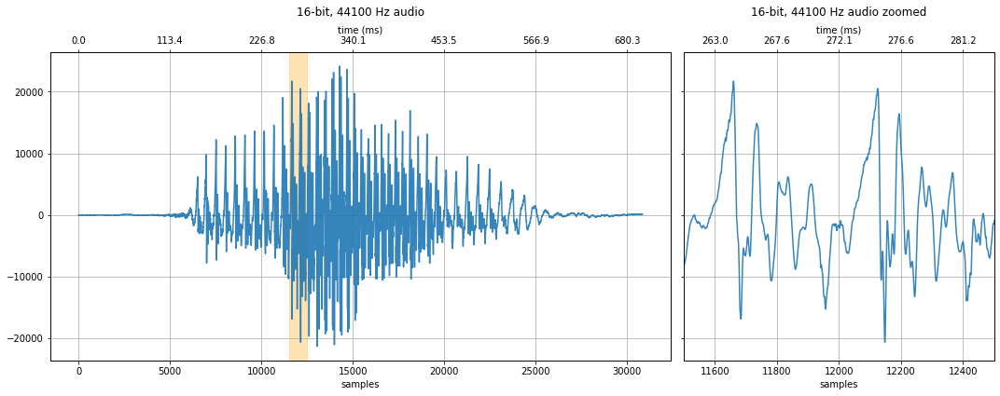

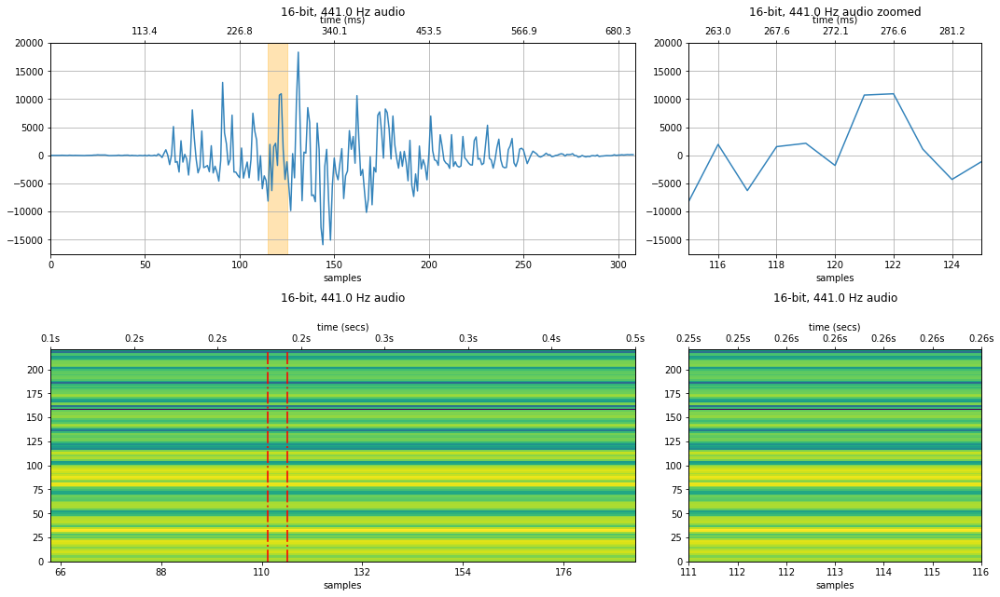

In [28]:
resample_factor = 100
new_sampling_rate = sampling_rate / resample_factor
audio_data_441 = audio_data_44100[::resample_factor]
resample_xlim_zoom = (xlim_zoom[0] / resample_factor, xlim_zoom[1] / resample_factor)
makelab.signal.plot_signal(audio_data_44100, sampling_rate, quantization_bits, xlim_zoom = xlim_zoom)
#plot_waveform(audio_data_441, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
makelab.signal.plot_signal_and_spectrogram(audio_data_441, new_sampling_rate, quantization_bits, xlim_zoom = resample_xlim_zoom)
ipd.Audio(audio_data_441, rate=new_sampling_rate)

# Sandbox

## Librosa plotting code

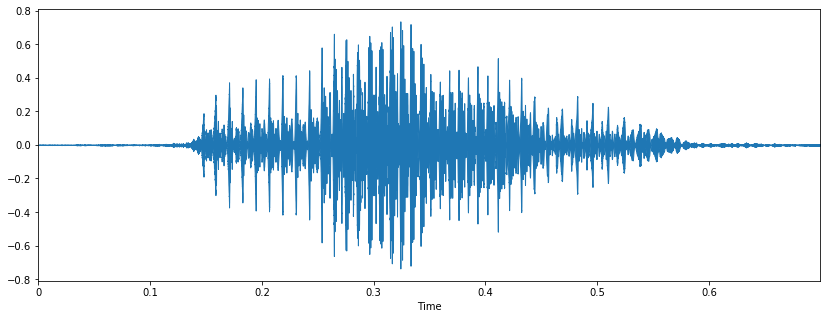

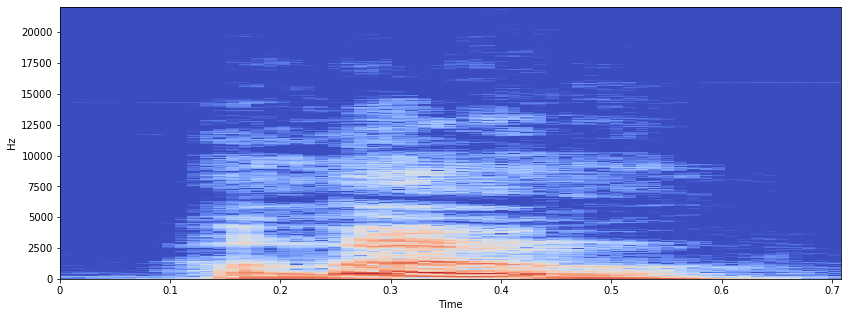

In [29]:
audio_data_44100, sampling_rate = librosa.load('data/audio/HumanVoice-Hello_16bit_44.1kHz_mono.wav', sr=44100)
plt.figure(figsize=(14, 5))
librosa.display.waveplot(audio_data_44100, sr=sampling_rate);

# https://musicinformationretrieval.com/stft.html
# https://www.kaggle.com/msripooja/steps-to-convert-audio-clip-to-spectrogram
X = librosa.stft(audio_data_44100)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='hz')
#plt.colorbar()

# TODO

- [Done] We can use a [stemplot](https://matplotlib.org/3.2.1/api/_as_gen/matplotlib.pyplot.stem.html) to show off sampling rates. 
- [Done] We can't really do a naive down sampling because we'd need to interpolate the points at the samples. Maybe we force a factor of 44100 Hz so it's perfectly divisible? Note the librosa library does a complex resampling with interpolation so wouldn't be great to showing a stem plot necessarily.
- [Done] maybe we show a 2x2 grid of visualizations where the top row is original signal and bottom row is the downsampled version (which uses stem plots) to emphasize discreteness
- [Done] draw highlights in main audio view that shows where zoom in window
- [Done] print out info about the downsampling, nyquist rate, etc.
- add in spectral frequency plot or maybe save for freq analysis notebook
- [Done] Create frequency sweep and show what happens with spectrogram?
- [Done] Talk about aliasing and the dangers of aliasing!